In [ ]:
import os
import struct
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import pandas as pd

import os
import re

#from google.colab import drive
#drive.mount('/content/gdrive/')

In [ ]:
AREA_WIDTH  = 10000
AREA_HIGHT = 1500

BLOCK_WIDTH  = 400
BLOCK_HEIGHT = 100

NUMBER_OF_SAMPLE = 401
NUMBER_OF_RECEIVERS = 401


file_name = "seismogram_1000_1000.bin"


# read media
# overall sizes are fixed
space_step = AREA_WIDTH / (NUMBER_OF_RECEIVERS - 1)
media = np.zeros(shape=(int(AREA_HIGHT / space_step) + 1, int(AREA_WIDTH / space_step) + 1), dtype=np.float64)

# x0 and y0 of the inclusion should be parsed from file name
# inclusion sizes are fixed
_, x0, y0 = file_name.split('.')[0].split('_')
left_x = int(int(x0) / space_step)
right_x = int((int(x0) + BLOCK_WIDTH) / space_step)
bottom_y = int(int(y0) / space_step)
top_y = int((int(y0) - BLOCK_HEIGHT) / space_step)

media[top_y:bottom_y, left_x:right_x] = 1

Media shape (61, 401)
Signal shape (401, 401)


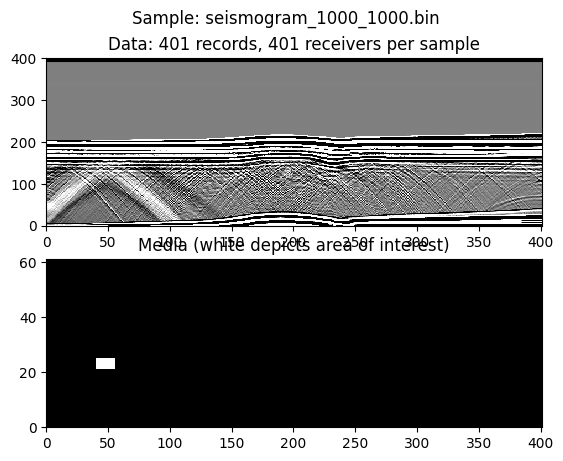

In [ ]:
# read signal
signal = np.ndarray(shape=(NUMBER_OF_SAMPLE, NUMBER_OF_RECEIVERS * 2), dtype=np.float64)
with open(os.path.join(file_name), 'rb') as fd:
    for i in range(NUMBER_OF_SAMPLE):
        ts = struct.unpack('d', fd.read(8))
        signal[i, :] = np.frombuffer(fd.read(8 * NUMBER_OF_RECEIVERS * 2), dtype=np.float64)

# we are interested in vy only
signal_vy = signal[:,1::2]
signal_vx = signal[:,0::2]

max_y = signal_vy.max()
max_x = signal_vx.max()
min_y = signal_vy.min()
min_x = signal_vx.min()

print("Media shape", media.shape)
print("Signal shape", signal_vy.shape)

# viz everything (invert OY for this)
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1)
ax1.pcolormesh(signal_vy[::-1,:], cmap=cm.gray, vmin=-1e-7, vmax=1e-7)
ax1.set_title(f'Data: {NUMBER_OF_SAMPLE} records, {NUMBER_OF_RECEIVERS} receivers per sample')
ax2.pcolormesh(media[::-1,:], cmap=cm.gray)
ax2.set_title(f'Media (white depicts area of interest)')
fig.suptitle(f'Sample: {file_name}')
plt.show()

In [ ]:
min_x

-2.6258105075198415e-06

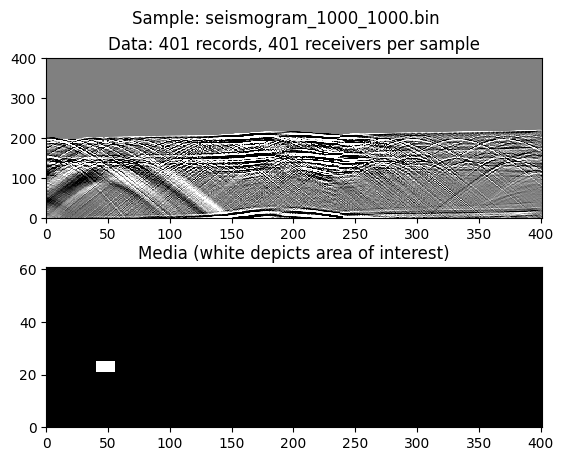

In [ ]:
# viz everything (invert OY for this)
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1)
ax1.pcolormesh(signal_vx[::-1,:], cmap=cm.gray, vmin=-1e-7, vmax=1e-7)
ax1.set_title(f'Data: {NUMBER_OF_SAMPLE} records, {NUMBER_OF_RECEIVERS} receivers per sample')
ax2.pcolormesh(media[::-1,:], cmap=cm.gray)
ax2.set_title(f'Media (white depicts area of interest)')
fig.suptitle(f'Sample: {file_name}')
plt.subplots_adjust(wspace=0.3, hspace=0.3)
plt.show()

Media shape (61, 401)
Signal shape (401, 401)


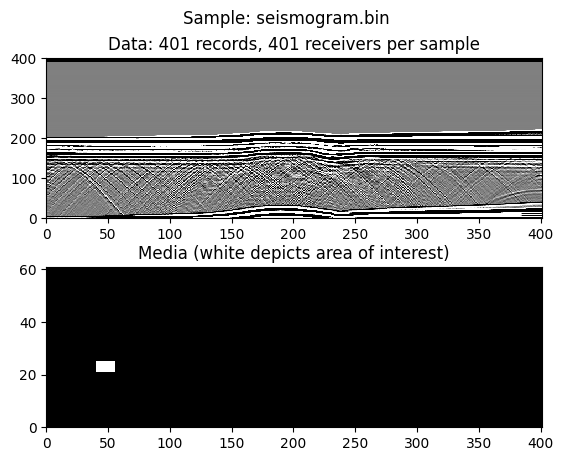

In [ ]:
file_name = 'seismogram.bin'

# read signal
signal = np.ndarray(shape=(NUMBER_OF_SAMPLE, NUMBER_OF_RECEIVERS * 2), dtype=np.float64)
with open(os.path.join('seismogram.bin'), 'rb') as fd:
    for i in range(NUMBER_OF_SAMPLE):
        ts = struct.unpack('d', fd.read(8))
        signal[i, :] = np.frombuffer(fd.read(8 * NUMBER_OF_RECEIVERS * 2), dtype=np.float64)

# we are interested in vy only
signal_vy_0 = signal[:,1::2]
signal_vx_0 = signal[:,0::2]

max_y = signal_vy_0.max()
max_x = signal_vx_0.max()
min_y = signal_vy_0.min()
min_x = signal_vx_0.min()

print("Media shape", media.shape)
print("Signal shape", signal_vy.shape)

# viz everything (invert OY for this)
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1)
ax1.pcolormesh(signal_vy_0[::-1,:], cmap=cm.gray, vmin=-1e-7, vmax=1e-7)
ax1.set_title(f'Data: {NUMBER_OF_SAMPLE} records, {NUMBER_OF_RECEIVERS} receivers per sample')
ax2.pcolormesh(media[::-1,:], cmap=cm.gray)
ax2.set_title(f'Media (white depicts area of interest)')
fig.suptitle(f'Sample: {file_name}')
plt.subplots_adjust(wspace=0.3, hspace=0.3)
plt.show()

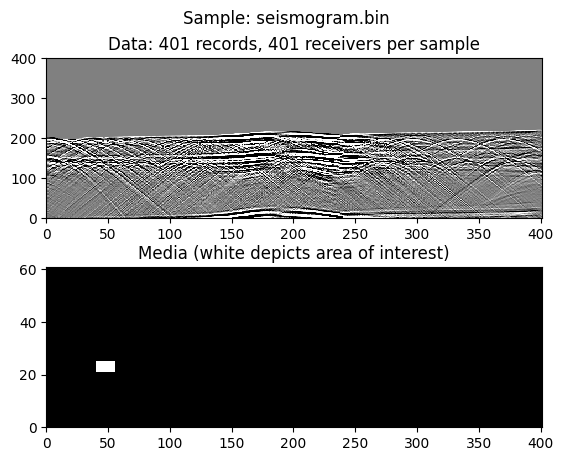

In [ ]:
# viz everything (invert OY for this)
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1)
ax1.pcolormesh(signal_vx_0[::-1,:], cmap=cm.gray, vmin=-1e-7, vmax=1e-7)
ax1.set_title(f'Data: {NUMBER_OF_SAMPLE} records, {NUMBER_OF_RECEIVERS} receivers per sample')
ax2.pcolormesh(media[::-1,:], cmap=cm.gray)
ax2.set_title(f'Media (white depicts area of interest)')
fig.suptitle(f'Sample: {file_name}')
plt.subplots_adjust(wspace=0.3, hspace=0.3)
plt.show()

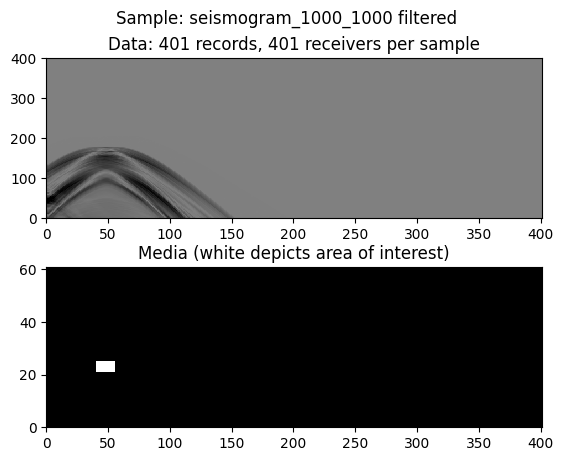

In [ ]:
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1)
ax1.pcolormesh(-abs(signal_vy[::-1,:]-signal_vy_0[::-1,:]), cmap=cm.gray, vmin=-1e-7, vmax=1e-7)
ax1.set_title(f'Data: {NUMBER_OF_SAMPLE} records, {NUMBER_OF_RECEIVERS} receivers per sample')
ax2.pcolormesh(media[::-1,:], cmap=cm.gray)
ax2.set_title(f'Media (white depicts area of interest)')
fig.suptitle(f'Sample: seismogram_1000_1000 filtered')
plt.subplots_adjust(wspace=0.3, hspace=0.3)
plt.show()


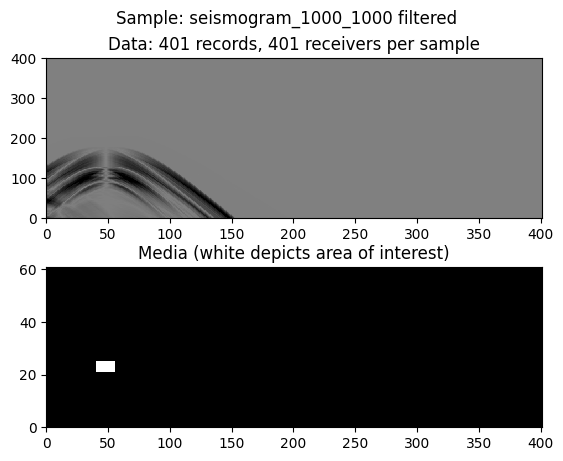

In [ ]:
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1)
ax1.pcolormesh(-abs(signal_vx[::-1,:]-signal_vx_0[::-1,:]), cmap=cm.gray, vmin=-1e-7, vmax=1e-7)
ax1.set_title(f'Data: {NUMBER_OF_SAMPLE} records, {NUMBER_OF_RECEIVERS} receivers per sample')
ax2.pcolormesh(media[::-1,:], cmap=cm.gray)
ax2.set_title(f'Media (white depicts area of interest)')
fig.suptitle(f'Sample: seismogram_1000_1000 filtered')
plt.subplots_adjust(wspace=0.3, hspace=0.3)
plt.show()


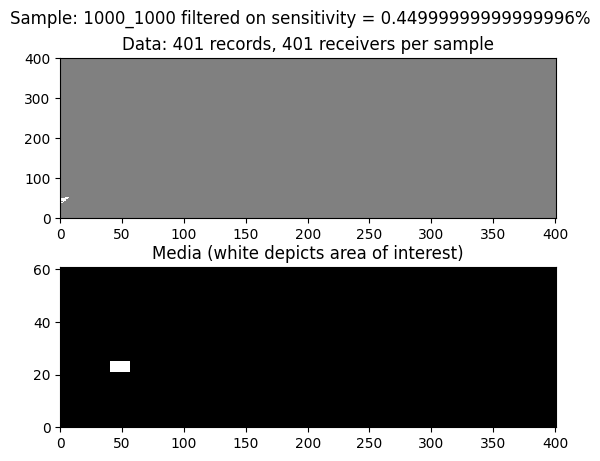

In [ ]:
proc_y = 0.0045
res_y = (abs(signal_vy[::-1,:]-signal_vy_0[::-1,:])> max_y*proc_y)*max_y

fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1)
ax1.pcolormesh(res_y, cmap=cm.gray, vmin=-1e-7, vmax=1e-7)
ax1.set_title(f'Data: {NUMBER_OF_SAMPLE} records, {NUMBER_OF_RECEIVERS} receivers per sample')
ax2.pcolormesh(media[::-1,:], cmap=cm.gray)
ax2.set_title(f'Media (white depicts area of interest)')
fig.suptitle(f'Sample: 1000_1000 filtered on sensitivity = {proc_y*100}%')
plt.subplots_adjust(wspace=0.3, hspace=0.3)
plt.show()


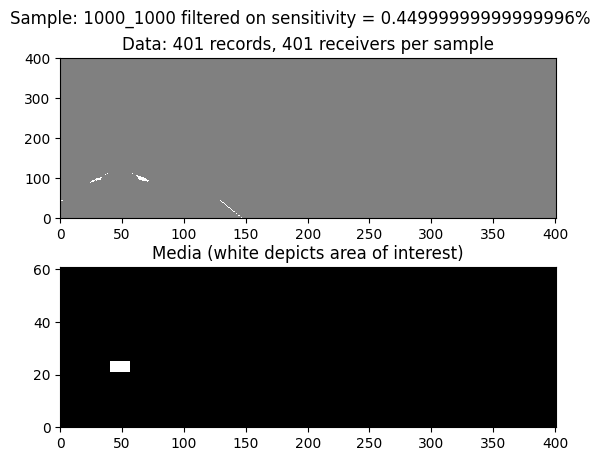

In [ ]:
proc_x = 0.0045
res_x = (abs(signal_vx[::-1,:]-signal_vx_0[::-1,:])> max_y*proc_x)*max_x

fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1)
ax1.pcolormesh(res_x, cmap=cm.gray, vmin=-1e-7, vmax=1e-7)
ax1.set_title(f'Data: {NUMBER_OF_SAMPLE} records, {NUMBER_OF_RECEIVERS} receivers per sample')
ax2.pcolormesh(media[::-1,:], cmap=cm.gray)
ax2.set_title(f'Media (white depicts area of interest)')
fig.suptitle(f'Sample: 1000_1000 filtered on sensitivity = {proc_x*100}%')
plt.subplots_adjust(wspace=0.3, hspace=0.3)
plt.show()

In [ ]:
path = %pwd

fds = sorted(os.listdir(path))

AREA_WIDTH  = 10000
AREA_HIGHT = 1500

BLOCK_WIDTH  = 400
BLOCK_HEIGHT = 100

NUMBER_OF_SAMPLE = 401
NUMBER_OF_RECEIVERS = 401

proc_y = 0.004
proc_x = 0.005
visib_y = np.zeros(shape=(int(AREA_HIGHT / space_step) + 1, int(AREA_WIDTH / space_step) + 1), dtype=np.float64)
visib_x = np.zeros(shape=(int(AREA_HIGHT / space_step) + 1, int(AREA_WIDTH / space_step) + 1), dtype=np.float64)

Media shape (61, 401)
Signal shape (401, 401)


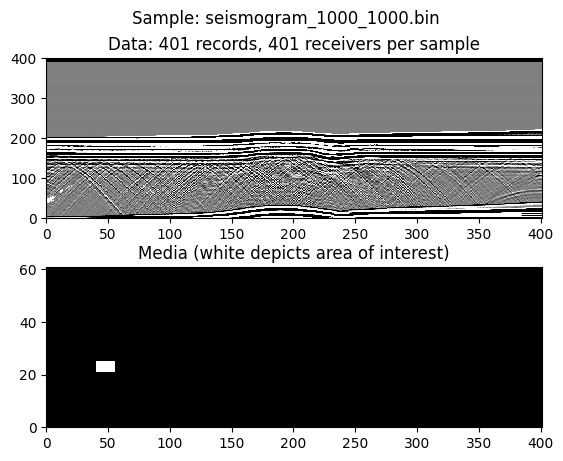

Media shape (61, 401)
Signal shape (401, 401)


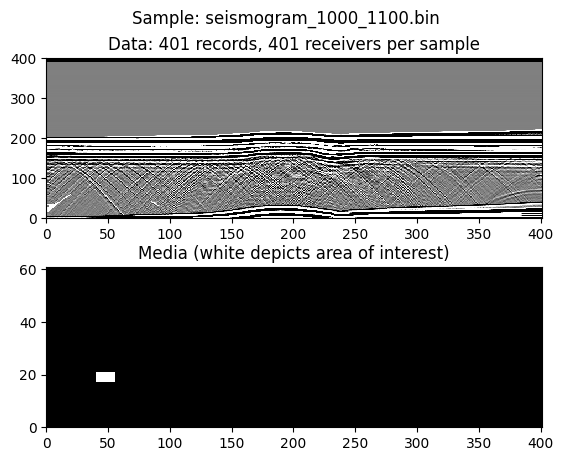

Media shape (61, 401)
Signal shape (401, 401)


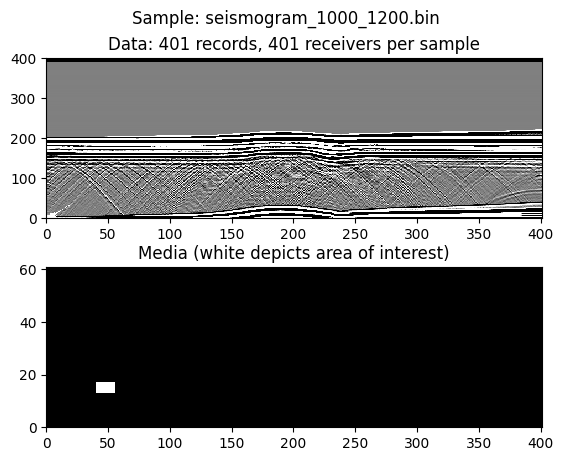

Media shape (61, 401)
Signal shape (401, 401)


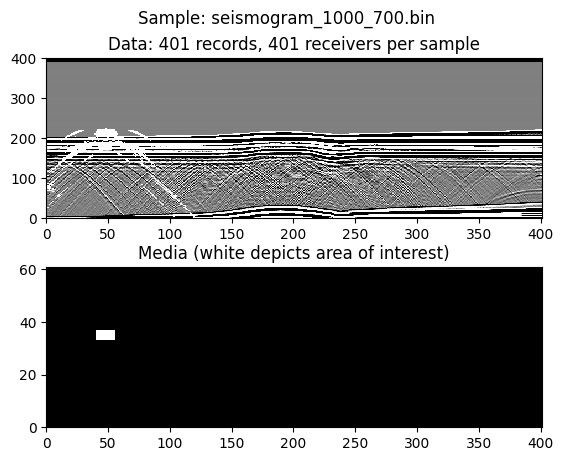

Media shape (61, 401)
Signal shape (401, 401)


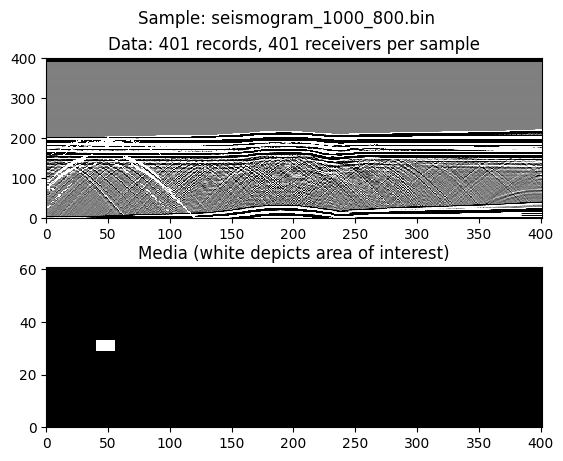

Media shape (61, 401)
Signal shape (401, 401)


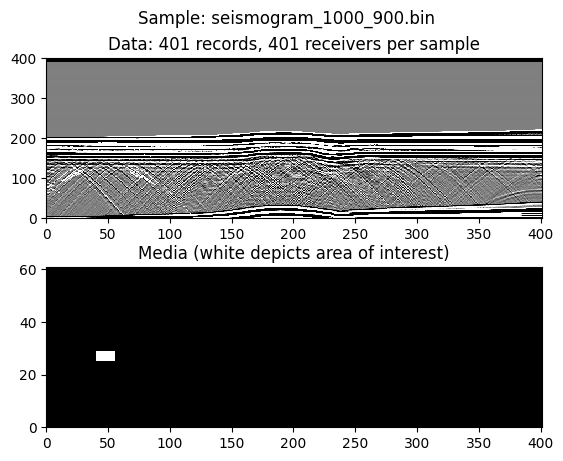

Media shape (61, 401)
Signal shape (401, 401)


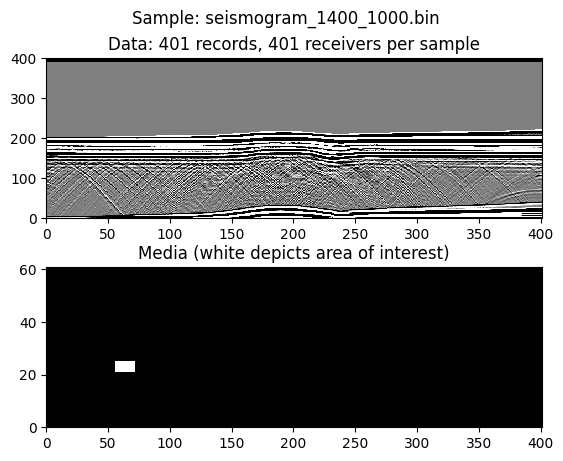

Media shape (61, 401)
Signal shape (401, 401)


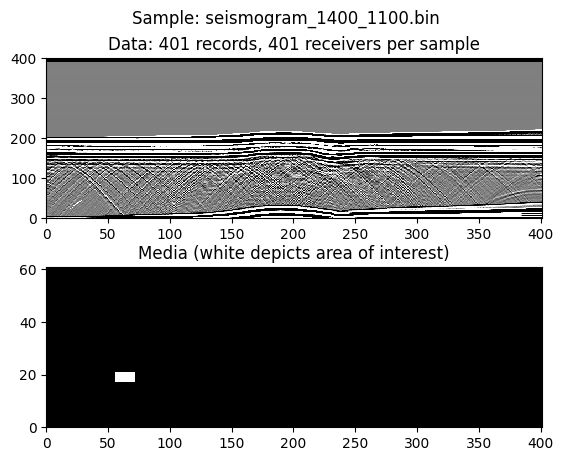

Media shape (61, 401)
Signal shape (401, 401)


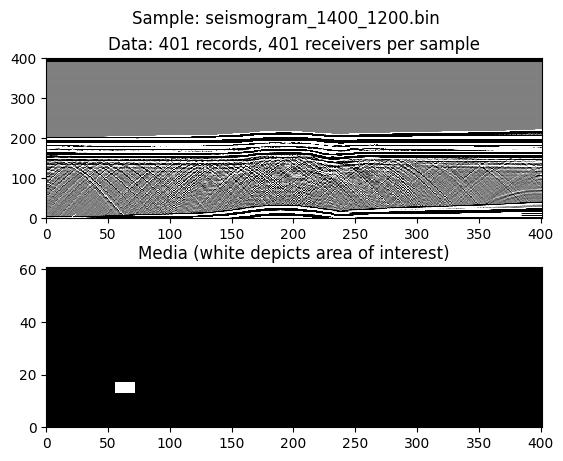

Media shape (61, 401)
Signal shape (401, 401)


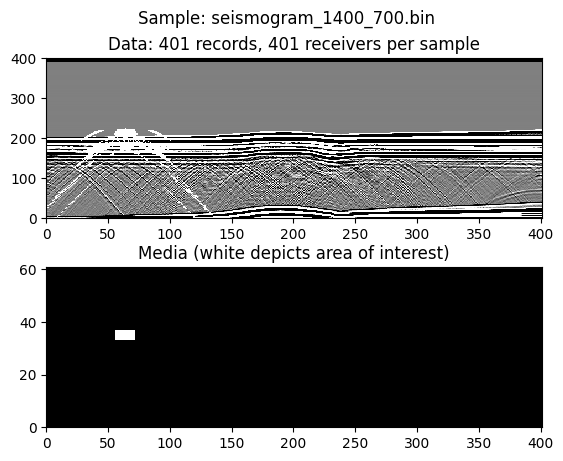

Media shape (61, 401)
Signal shape (401, 401)


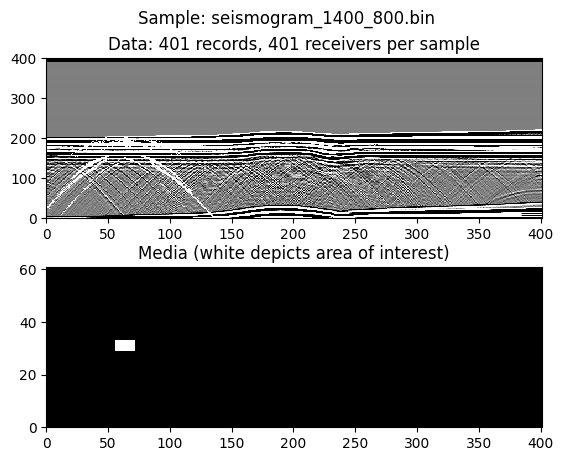

Media shape (61, 401)
Signal shape (401, 401)


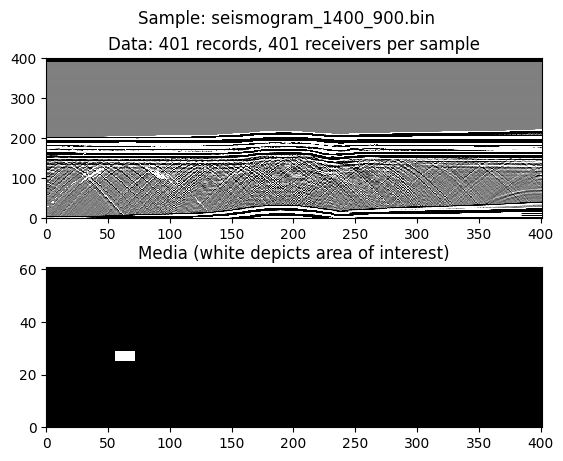

Media shape (61, 401)
Signal shape (401, 401)


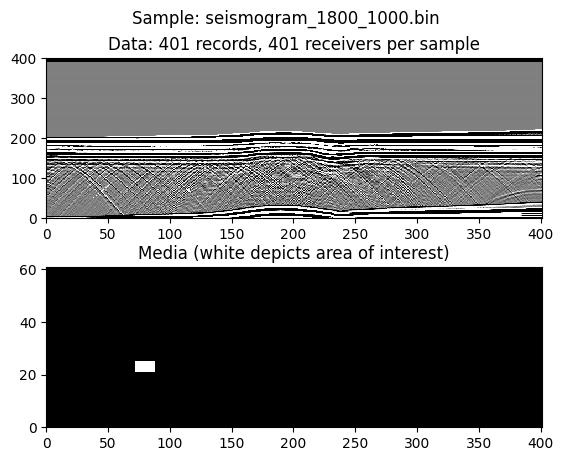

Media shape (61, 401)
Signal shape (401, 401)


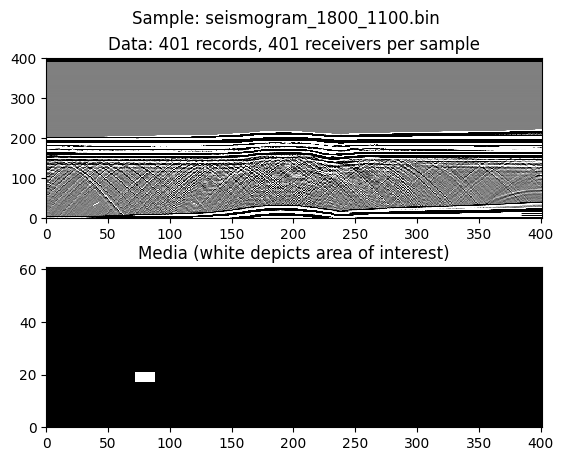

Media shape (61, 401)
Signal shape (401, 401)


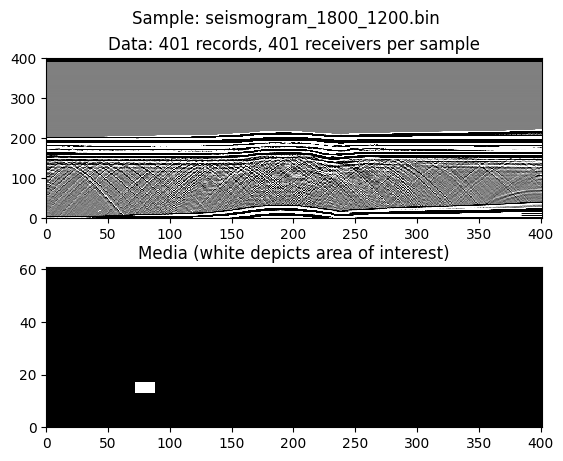

Media shape (61, 401)
Signal shape (401, 401)


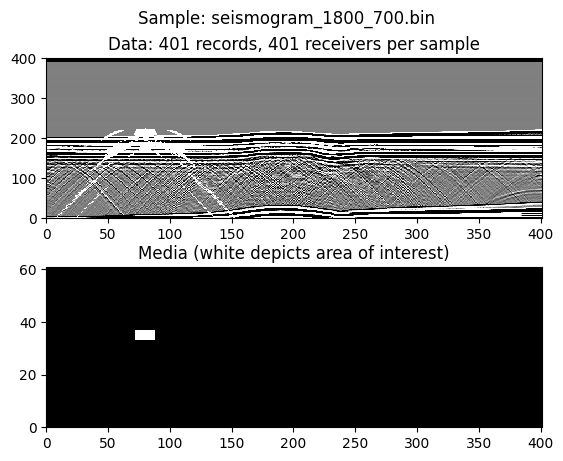

Media shape (61, 401)
Signal shape (401, 401)


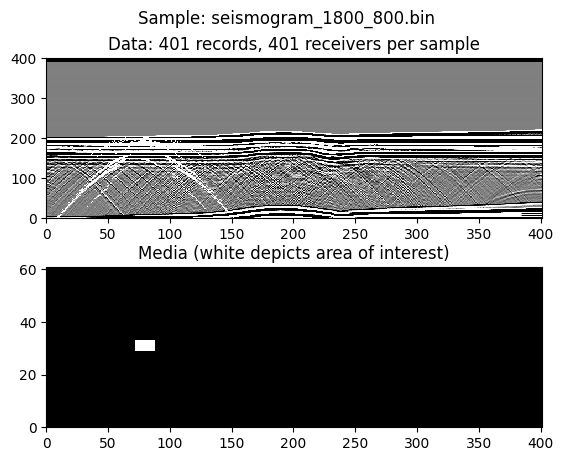

Media shape (61, 401)
Signal shape (401, 401)


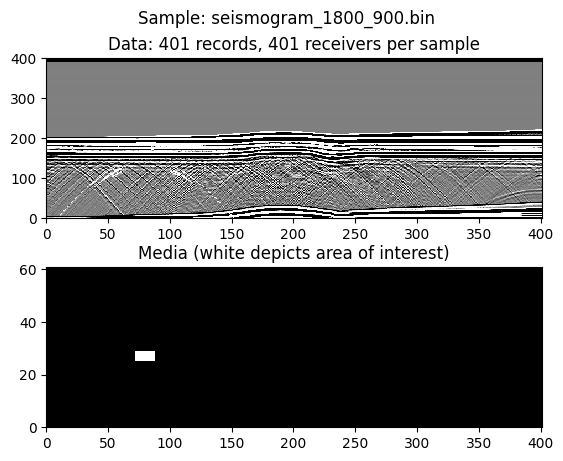

Media shape (61, 401)
Signal shape (401, 401)


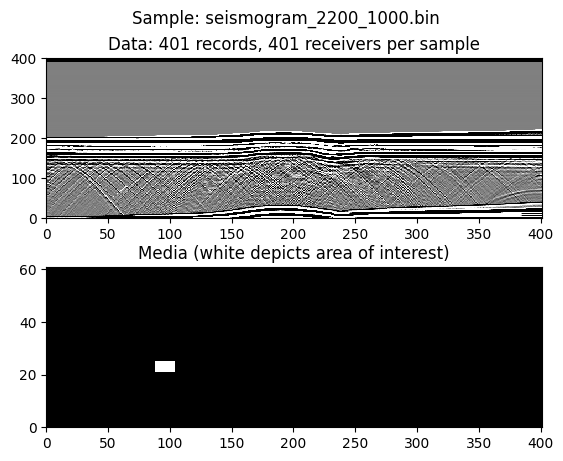

Media shape (61, 401)
Signal shape (401, 401)


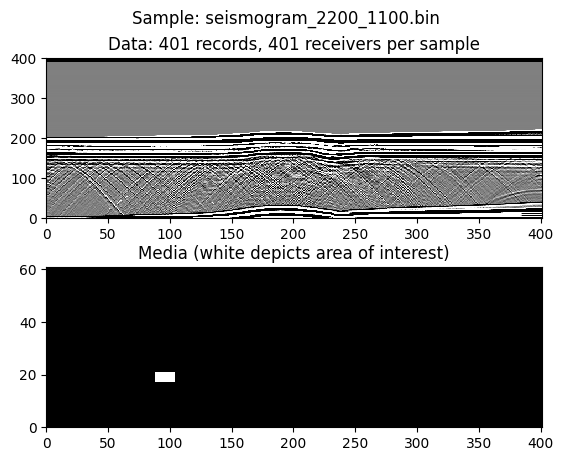

Media shape (61, 401)
Signal shape (401, 401)


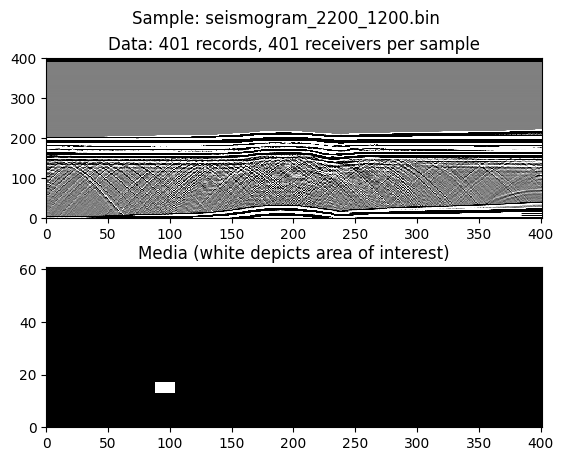

Media shape (61, 401)
Signal shape (401, 401)


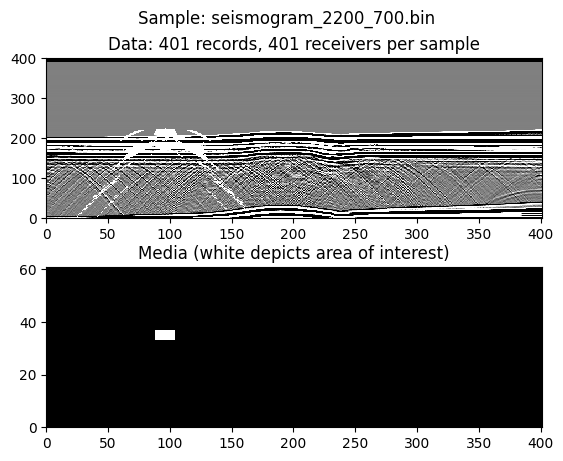

Media shape (61, 401)
Signal shape (401, 401)


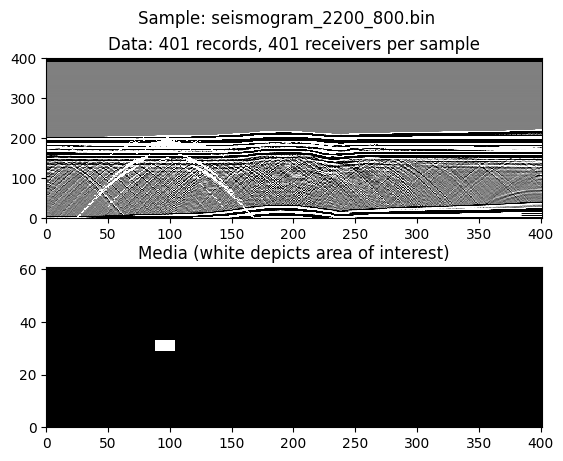

Media shape (61, 401)
Signal shape (401, 401)


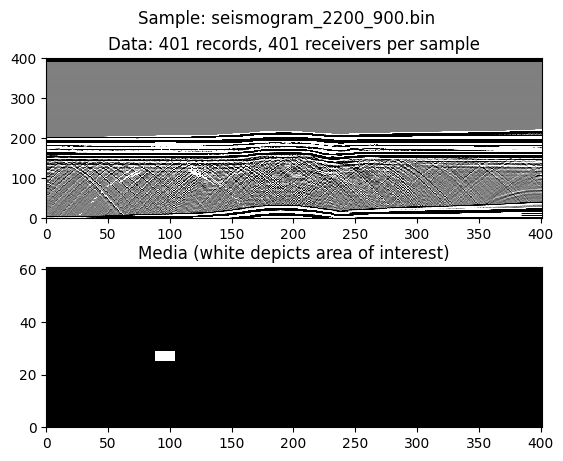

Media shape (61, 401)
Signal shape (401, 401)


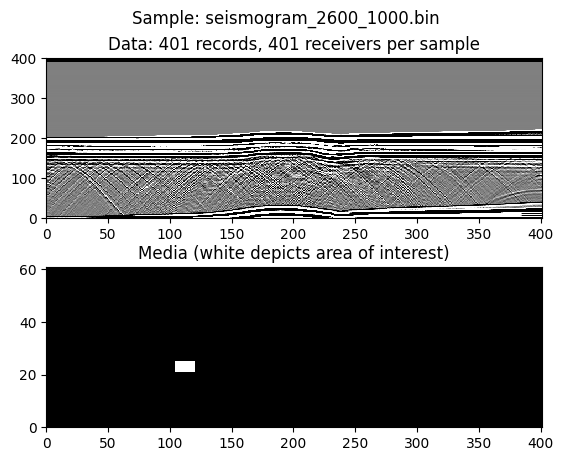

Media shape (61, 401)
Signal shape (401, 401)


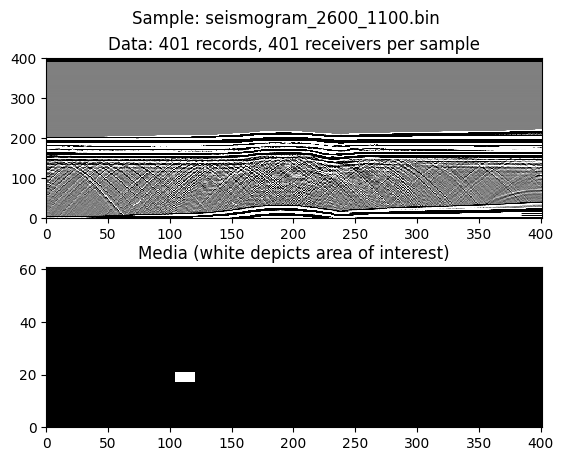

Media shape (61, 401)
Signal shape (401, 401)


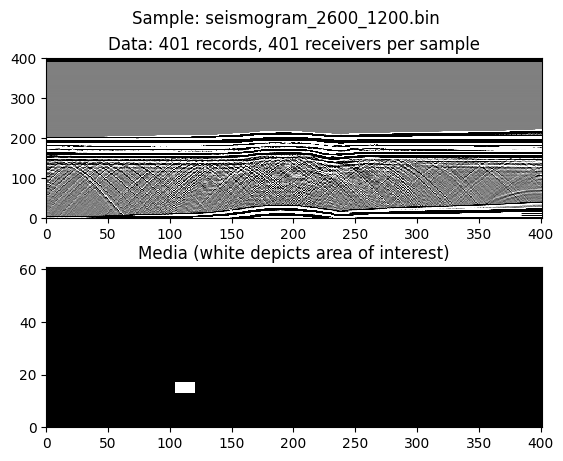

Media shape (61, 401)
Signal shape (401, 401)


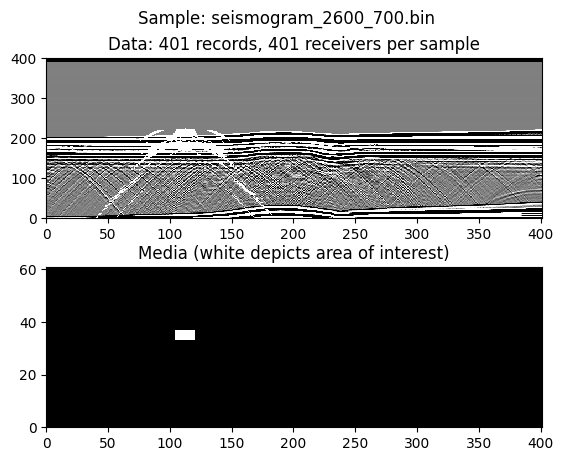

Media shape (61, 401)
Signal shape (401, 401)


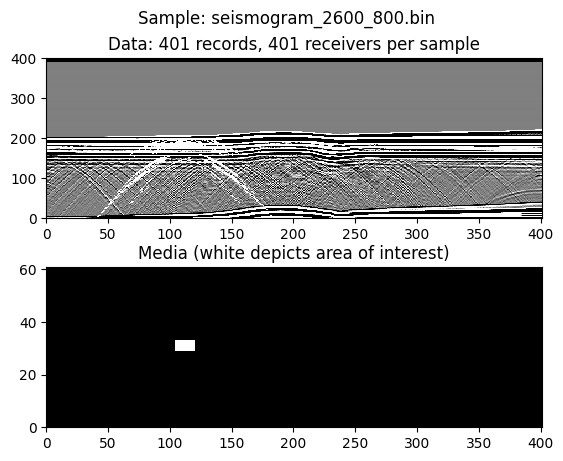

Media shape (61, 401)
Signal shape (401, 401)


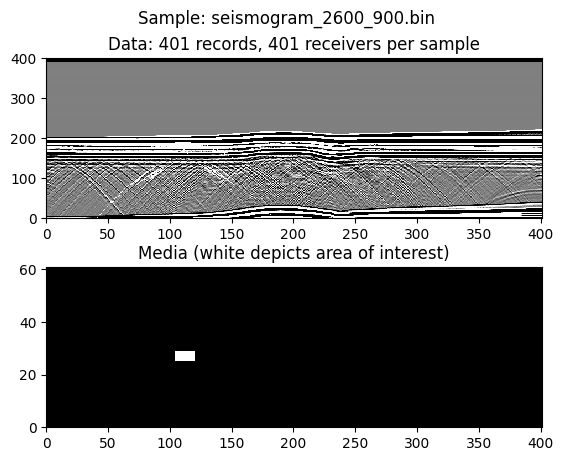

Media shape (61, 401)
Signal shape (401, 401)


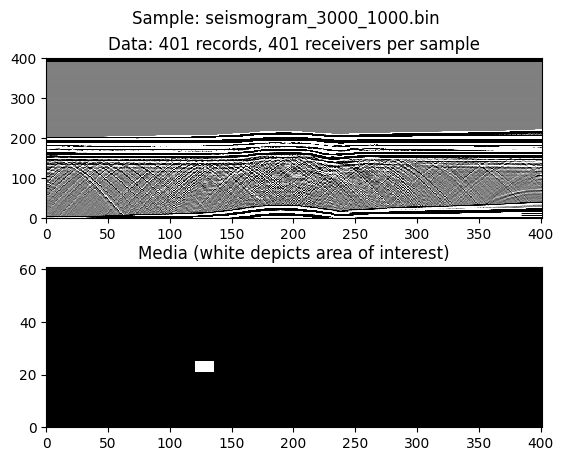

Media shape (61, 401)
Signal shape (401, 401)


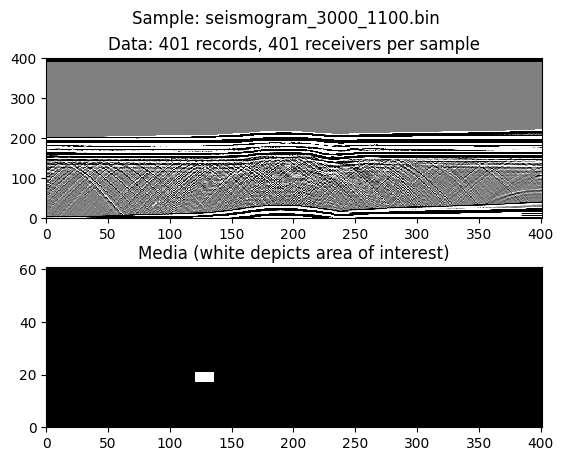

Media shape (61, 401)
Signal shape (401, 401)


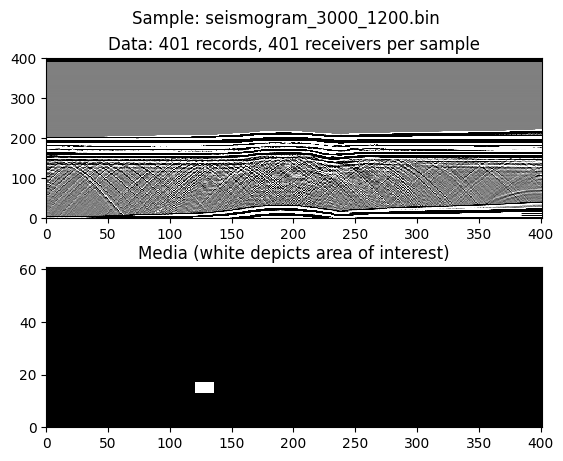

Media shape (61, 401)
Signal shape (401, 401)


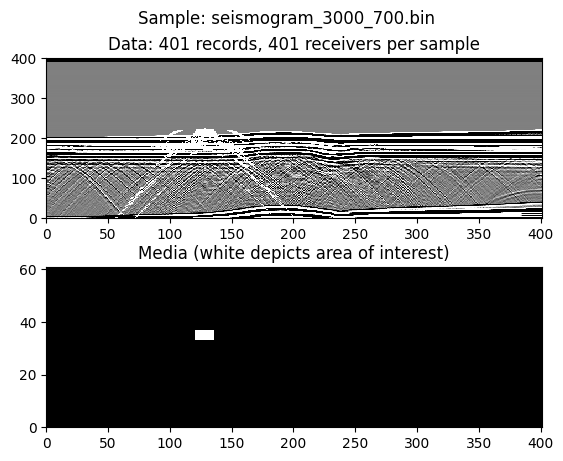

Media shape (61, 401)
Signal shape (401, 401)


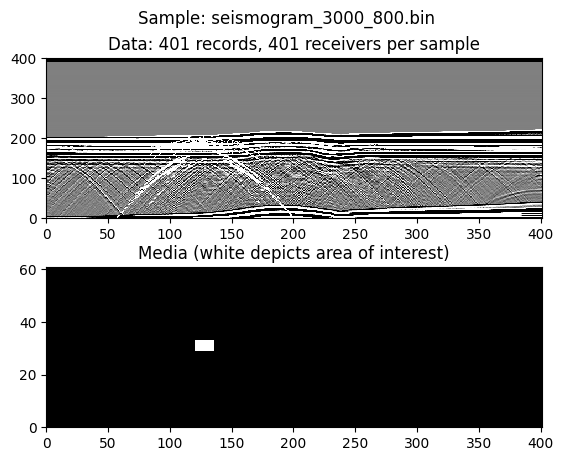

Media shape (61, 401)
Signal shape (401, 401)


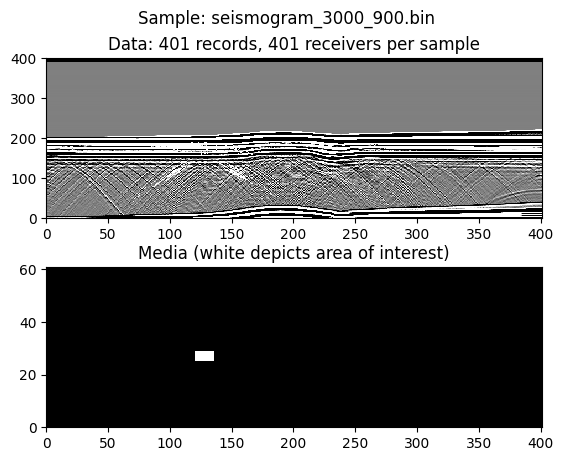

Media shape (61, 401)
Signal shape (401, 401)


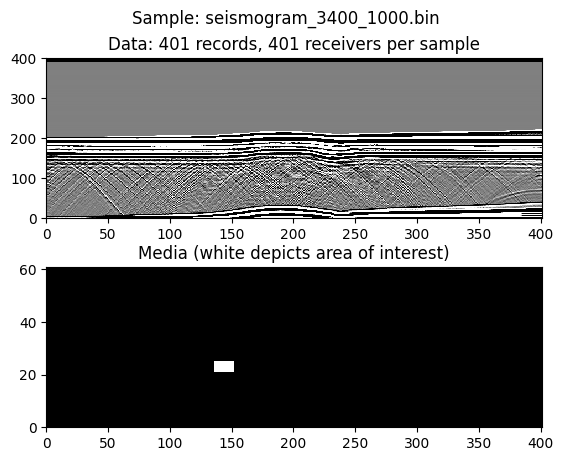

Media shape (61, 401)
Signal shape (401, 401)


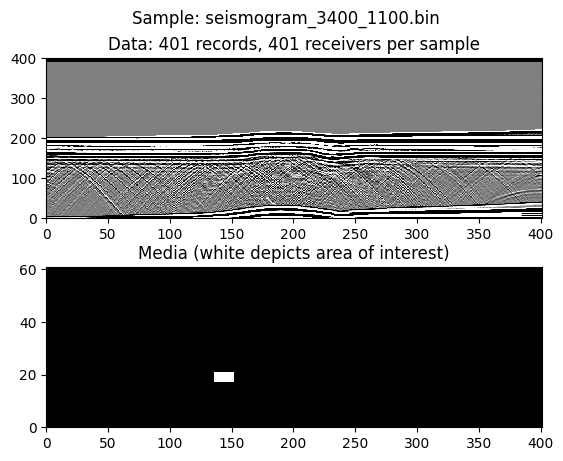

Media shape (61, 401)
Signal shape (401, 401)


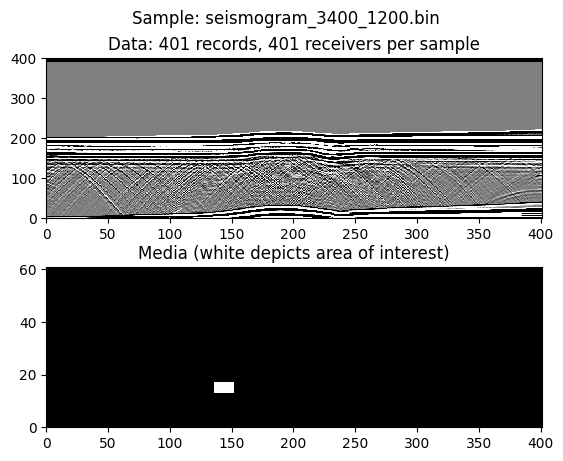

Media shape (61, 401)
Signal shape (401, 401)


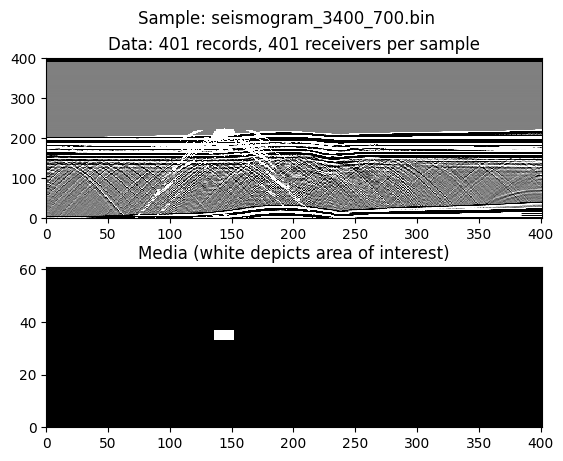

Media shape (61, 401)
Signal shape (401, 401)


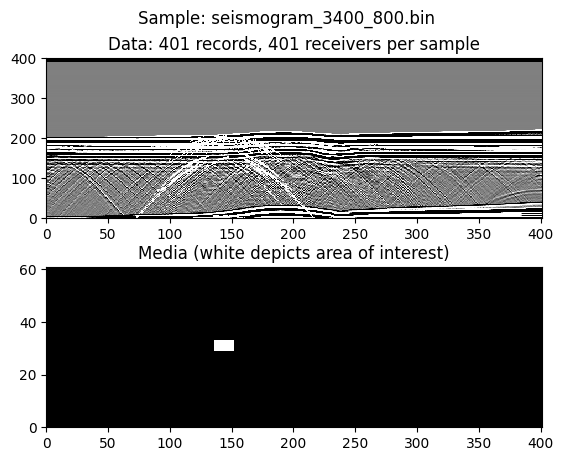

Media shape (61, 401)
Signal shape (401, 401)


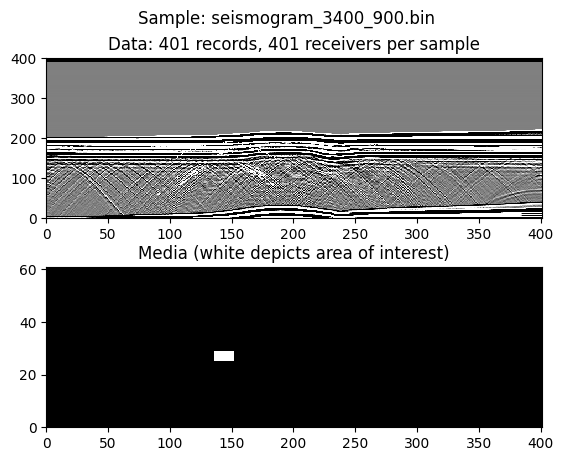

Media shape (61, 401)
Signal shape (401, 401)


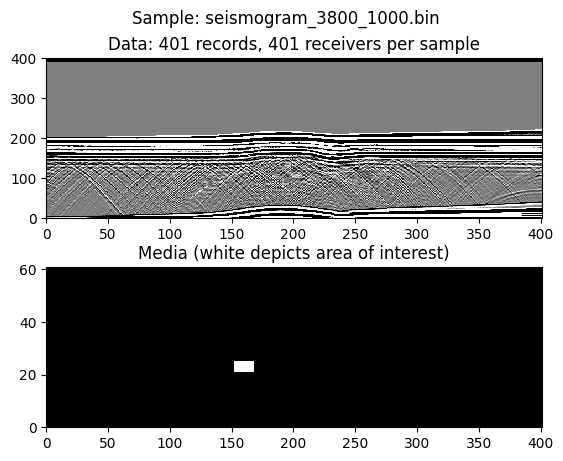

Media shape (61, 401)
Signal shape (401, 401)


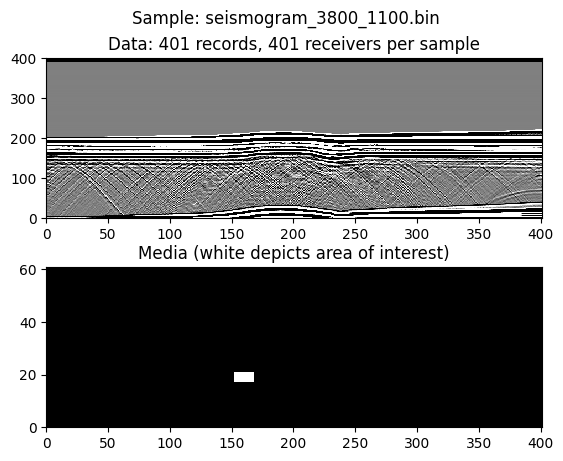

Media shape (61, 401)
Signal shape (401, 401)


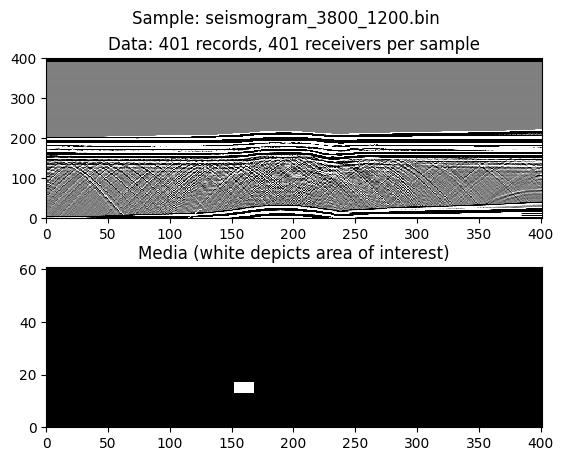

Media shape (61, 401)
Signal shape (401, 401)


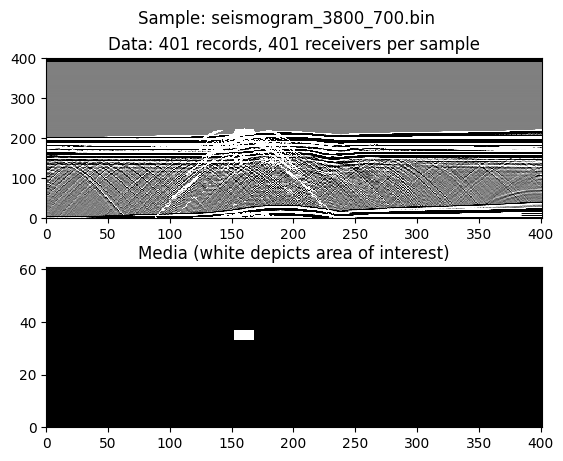

Media shape (61, 401)
Signal shape (401, 401)


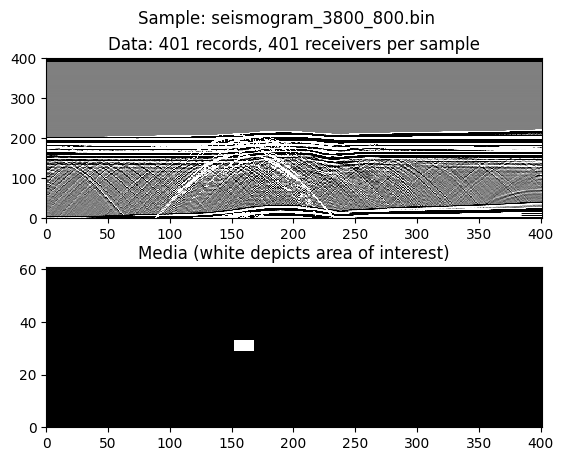

Media shape (61, 401)
Signal shape (401, 401)


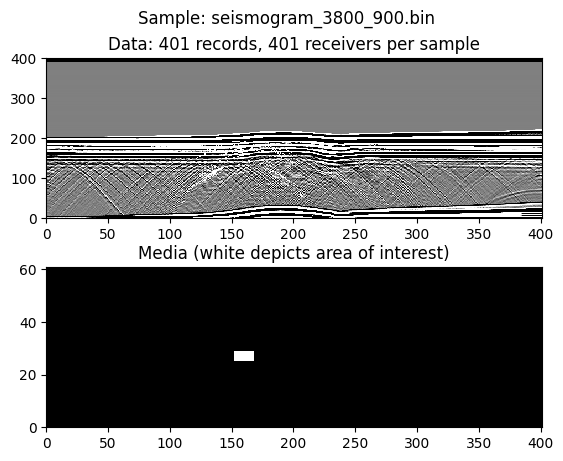

Media shape (61, 401)
Signal shape (401, 401)


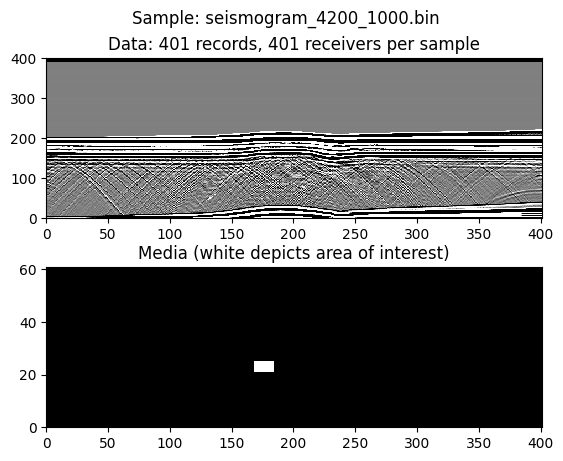

Media shape (61, 401)
Signal shape (401, 401)


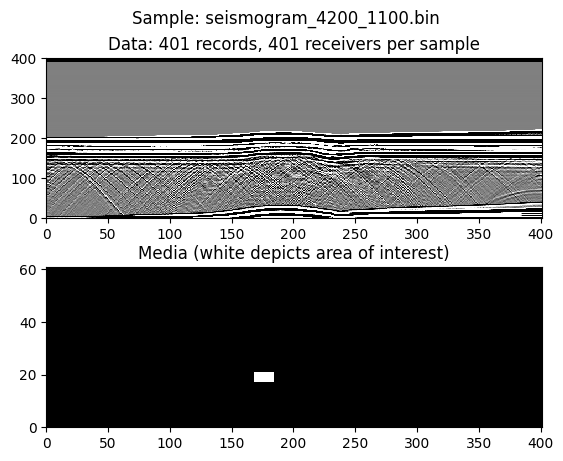

Media shape (61, 401)
Signal shape (401, 401)


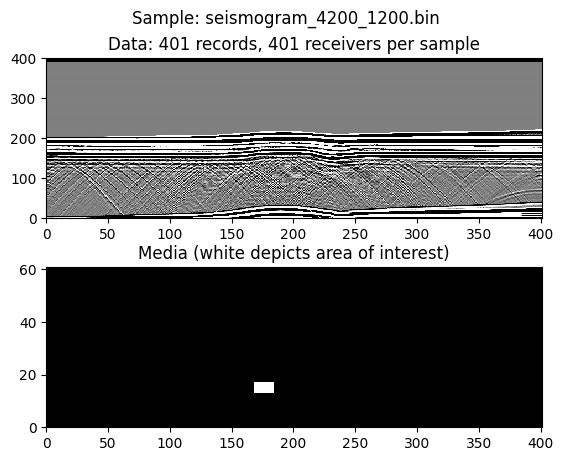

Media shape (61, 401)
Signal shape (401, 401)


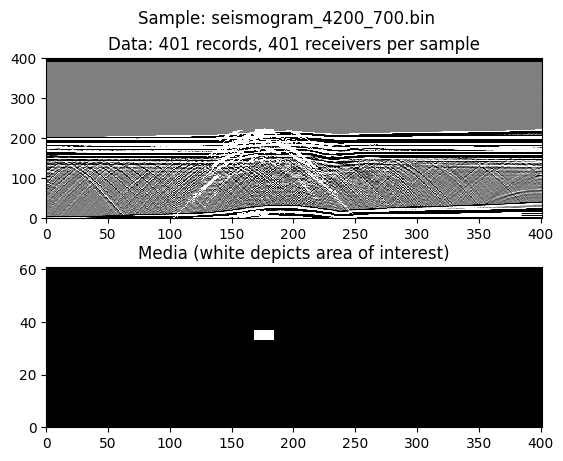

Media shape (61, 401)
Signal shape (401, 401)


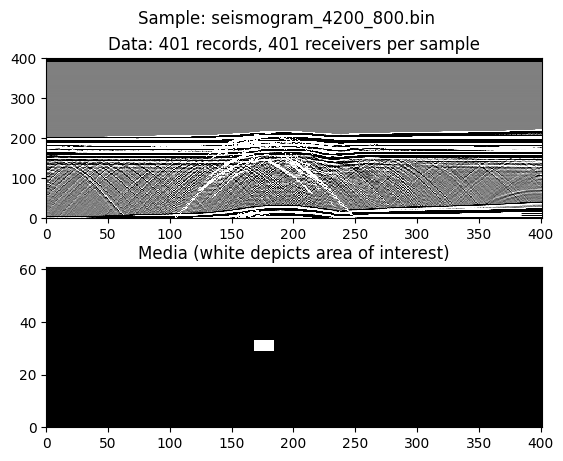

Media shape (61, 401)
Signal shape (401, 401)


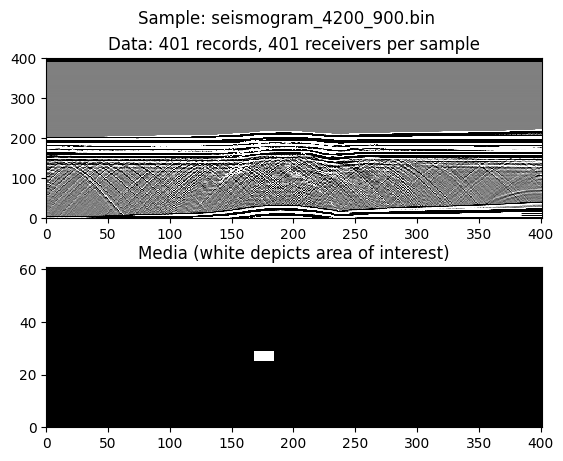

Media shape (61, 401)
Signal shape (401, 401)


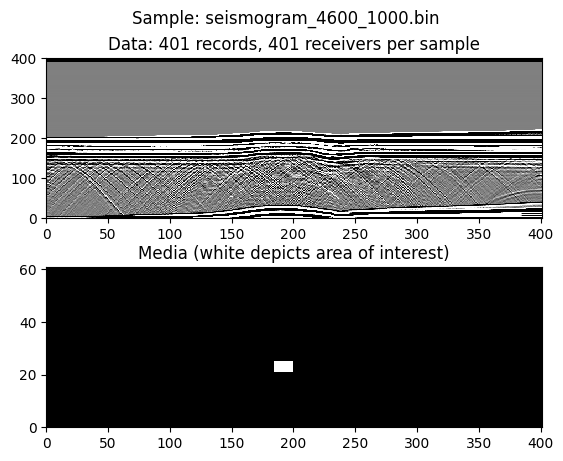

Media shape (61, 401)
Signal shape (401, 401)


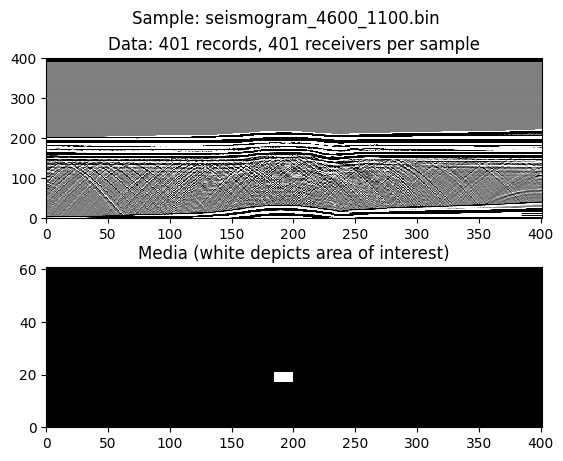

Media shape (61, 401)
Signal shape (401, 401)


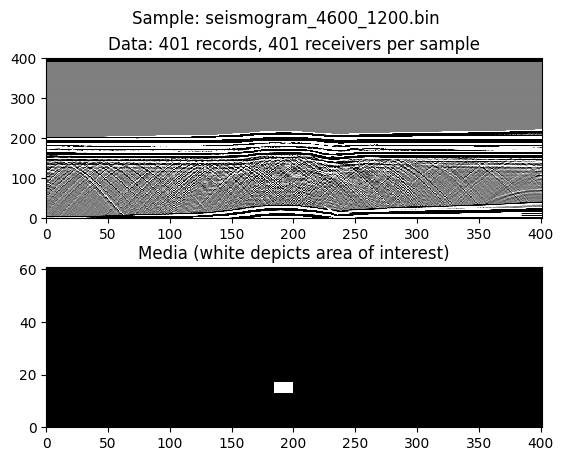

Media shape (61, 401)
Signal shape (401, 401)


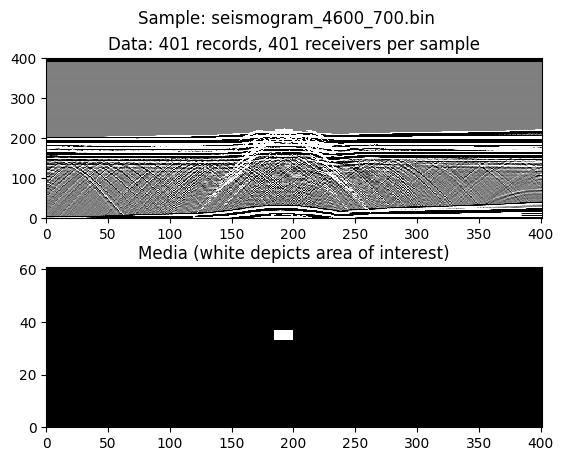

Media shape (61, 401)
Signal shape (401, 401)


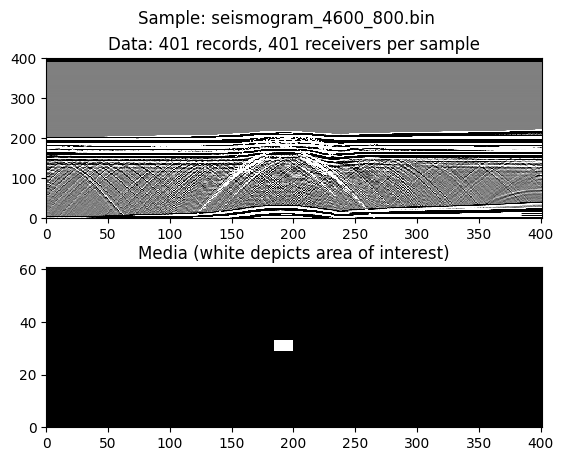

Media shape (61, 401)
Signal shape (401, 401)


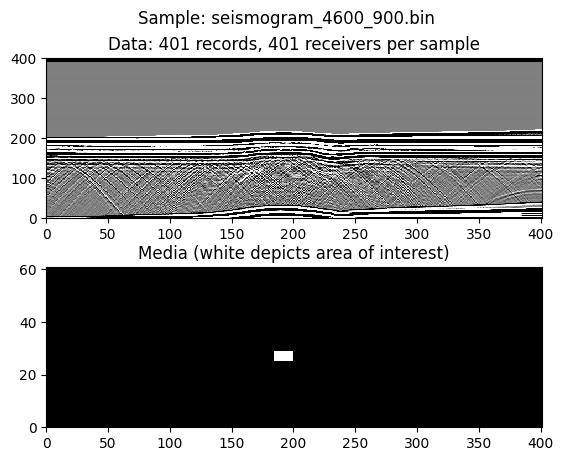

Media shape (61, 401)
Signal shape (401, 401)


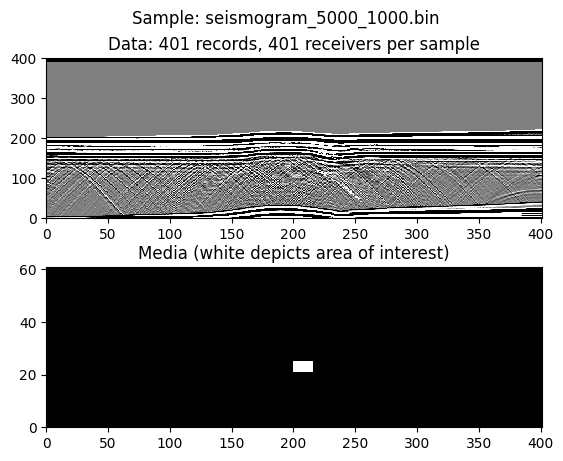

Media shape (61, 401)
Signal shape (401, 401)


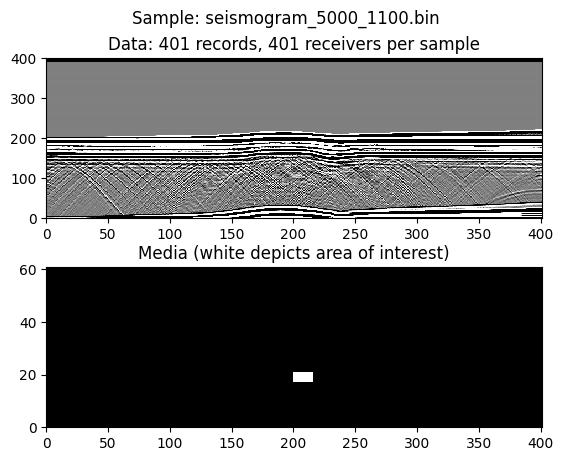

Media shape (61, 401)
Signal shape (401, 401)


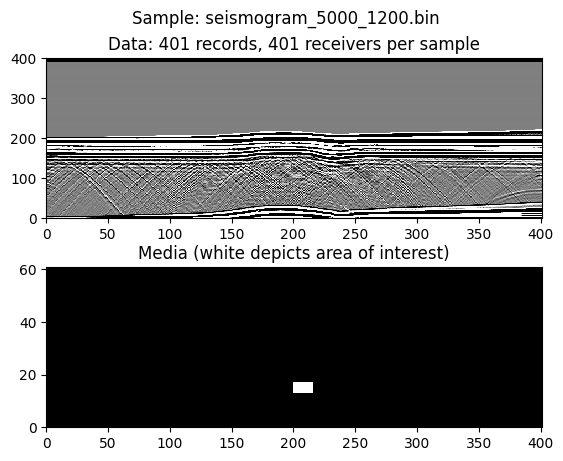

Media shape (61, 401)
Signal shape (401, 401)


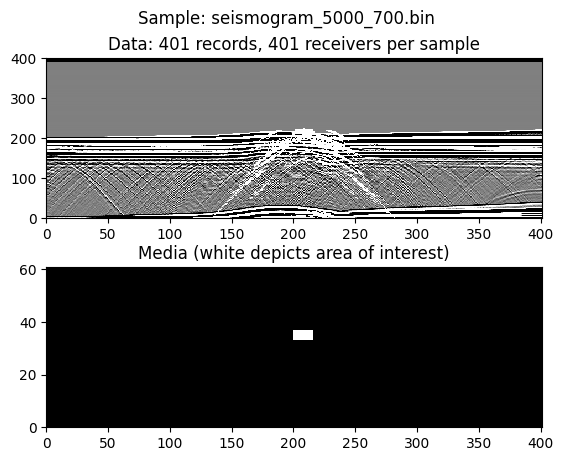

Media shape (61, 401)
Signal shape (401, 401)


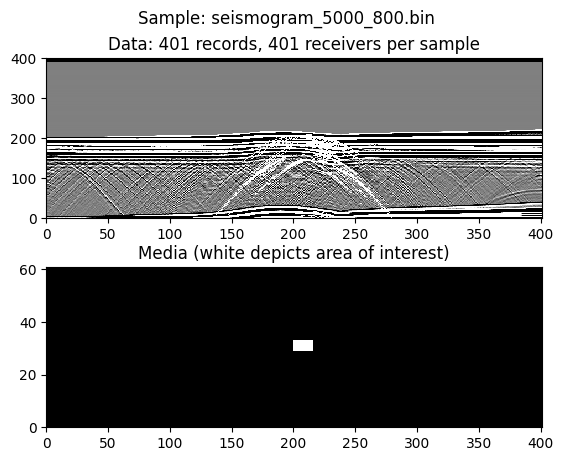

Media shape (61, 401)
Signal shape (401, 401)


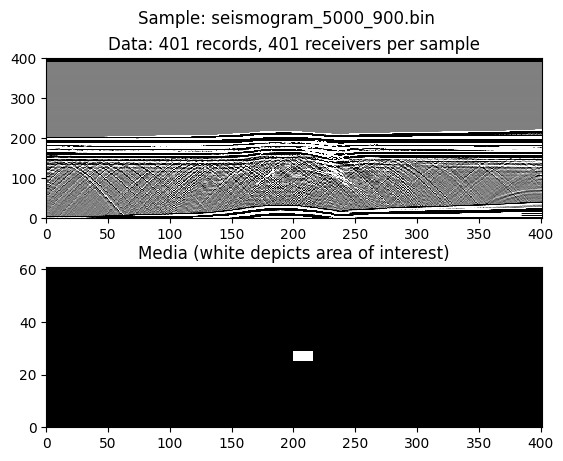

Media shape (61, 401)
Signal shape (401, 401)


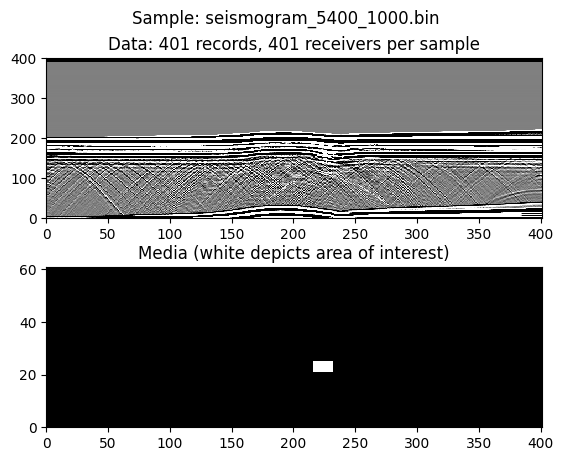

Media shape (61, 401)
Signal shape (401, 401)


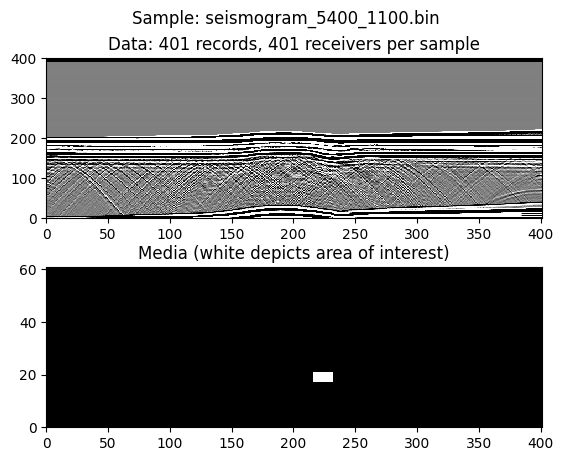

Media shape (61, 401)
Signal shape (401, 401)


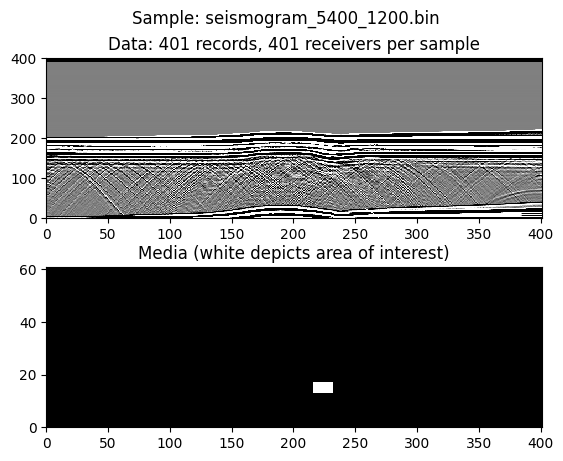

Media shape (61, 401)
Signal shape (401, 401)


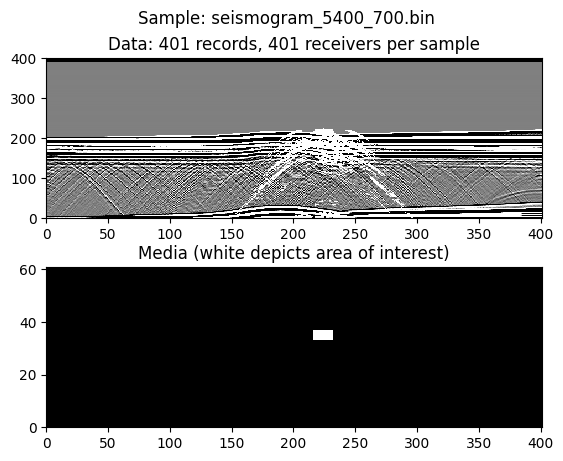

Media shape (61, 401)
Signal shape (401, 401)


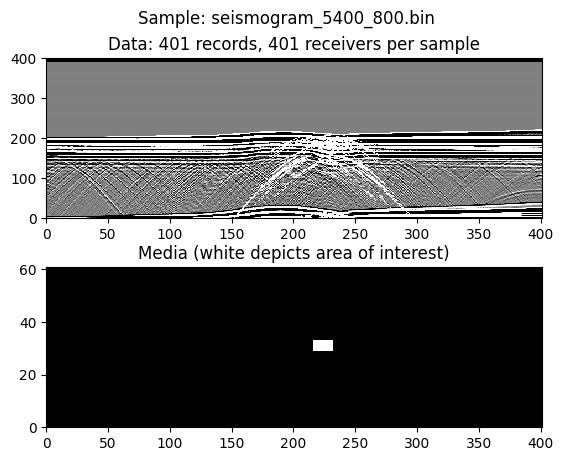

Media shape (61, 401)
Signal shape (401, 401)


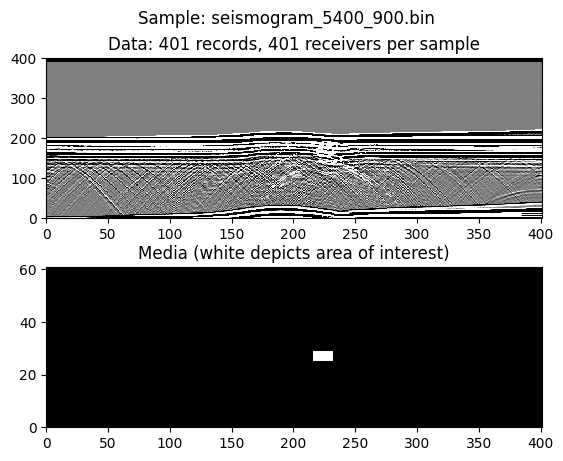

Media shape (61, 401)
Signal shape (401, 401)


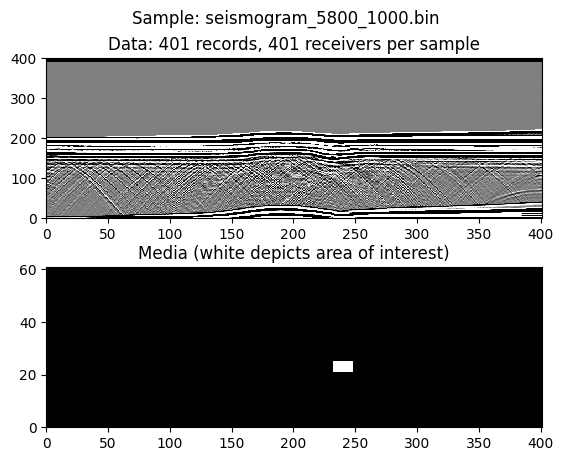

Media shape (61, 401)
Signal shape (401, 401)


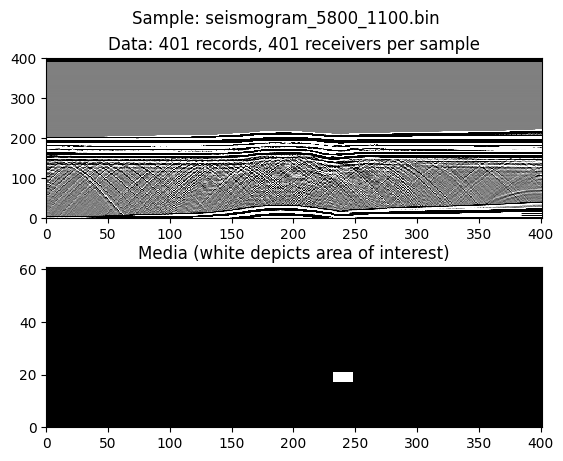

Media shape (61, 401)
Signal shape (401, 401)


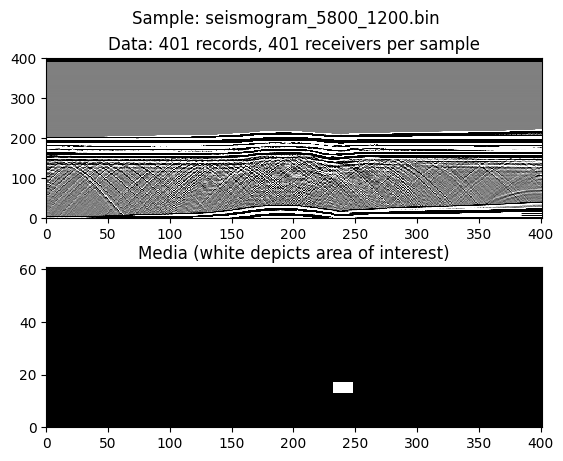

Media shape (61, 401)
Signal shape (401, 401)


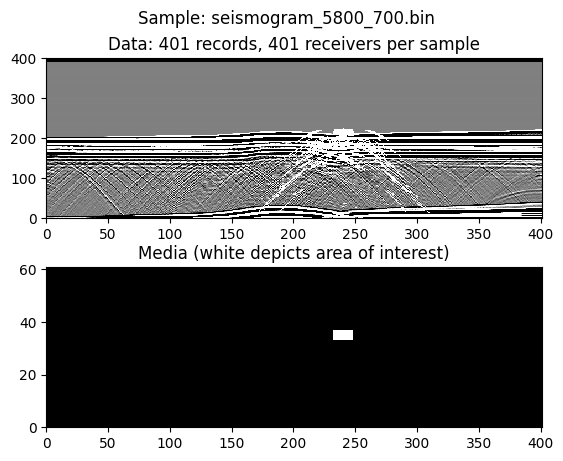

Media shape (61, 401)
Signal shape (401, 401)


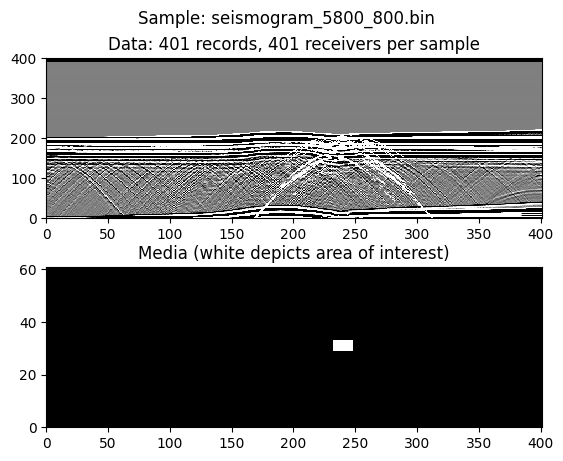

Media shape (61, 401)
Signal shape (401, 401)


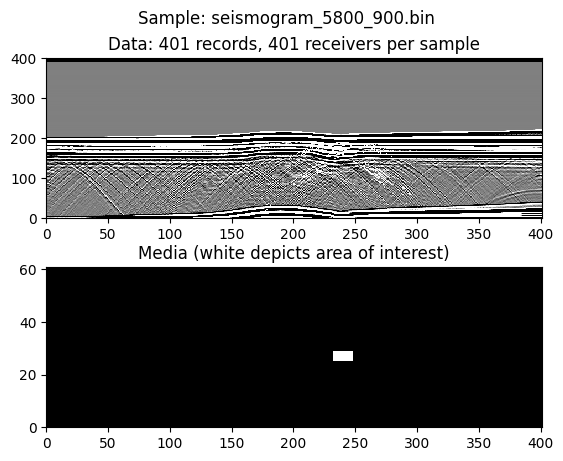

Media shape (61, 401)
Signal shape (401, 401)


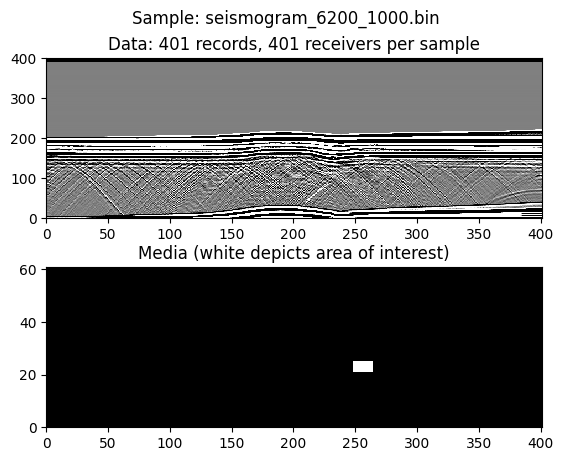

Media shape (61, 401)
Signal shape (401, 401)


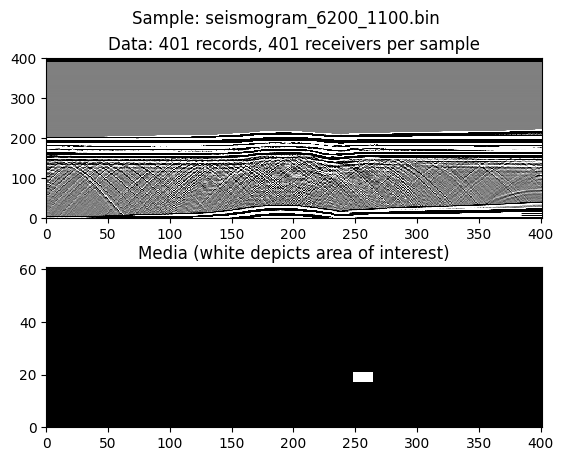

Media shape (61, 401)
Signal shape (401, 401)


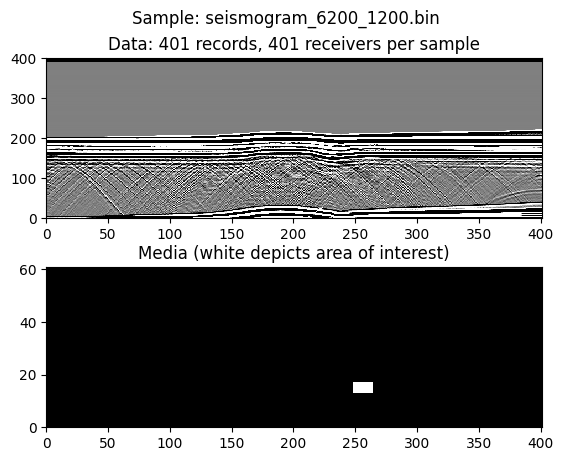

Media shape (61, 401)
Signal shape (401, 401)


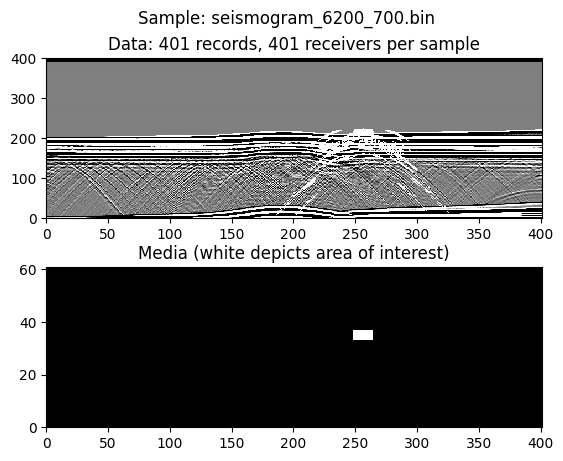

Media shape (61, 401)
Signal shape (401, 401)


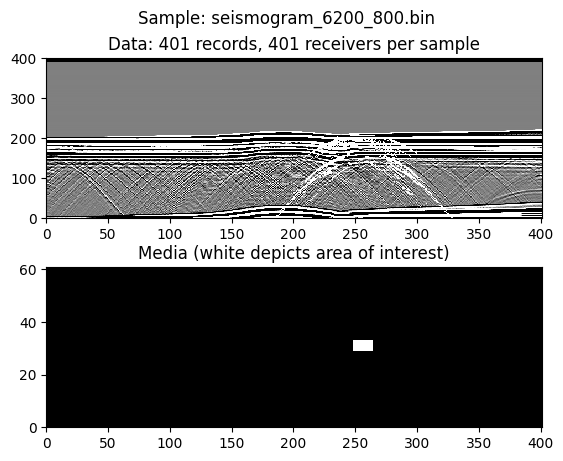

Media shape (61, 401)
Signal shape (401, 401)


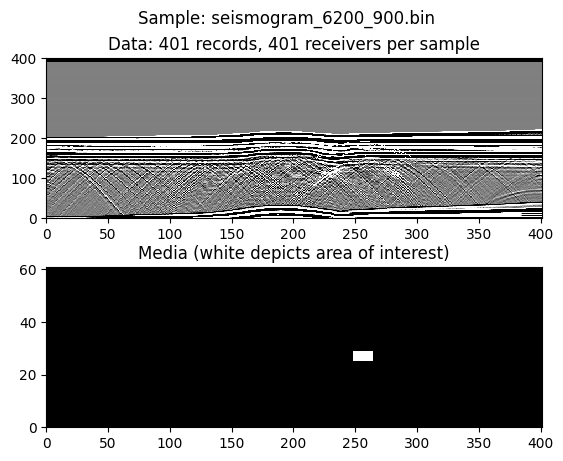

Media shape (61, 401)
Signal shape (401, 401)


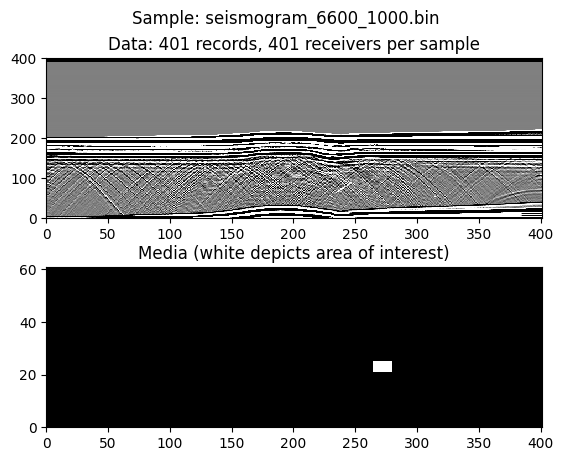

Media shape (61, 401)
Signal shape (401, 401)


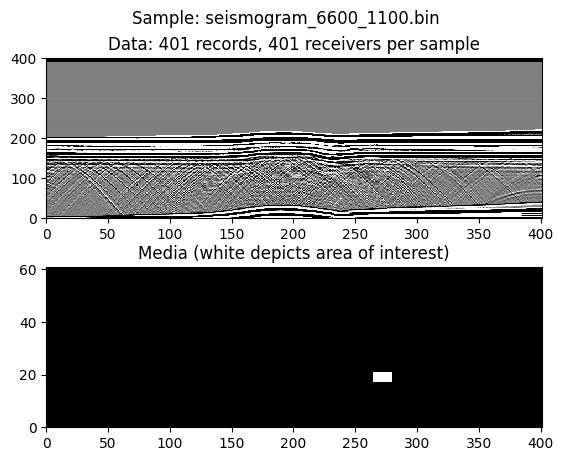

Media shape (61, 401)
Signal shape (401, 401)


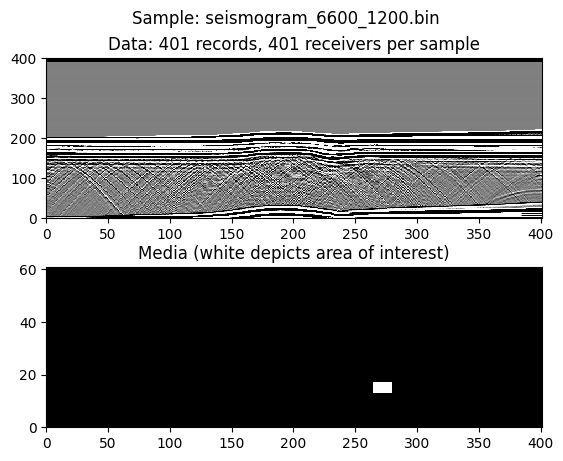

Media shape (61, 401)
Signal shape (401, 401)


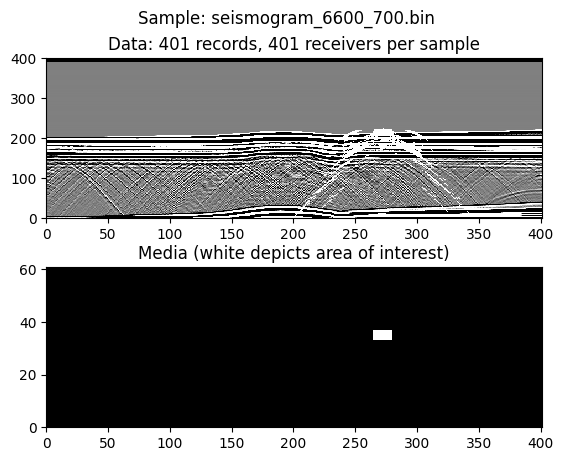

Media shape (61, 401)
Signal shape (401, 401)


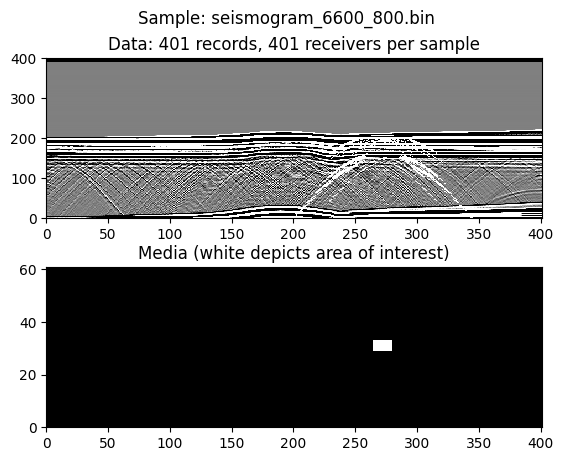

Media shape (61, 401)
Signal shape (401, 401)


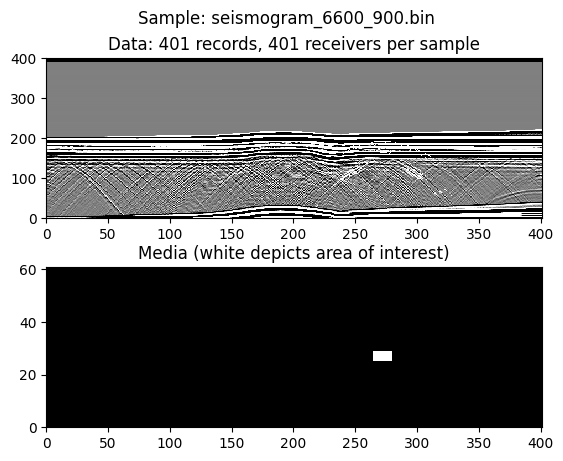

Media shape (61, 401)
Signal shape (401, 401)


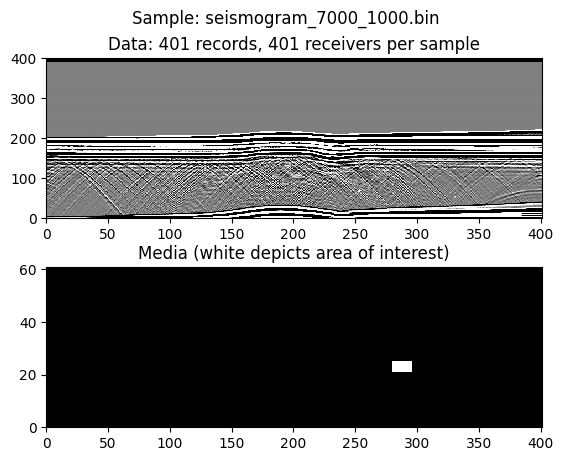

Media shape (61, 401)
Signal shape (401, 401)


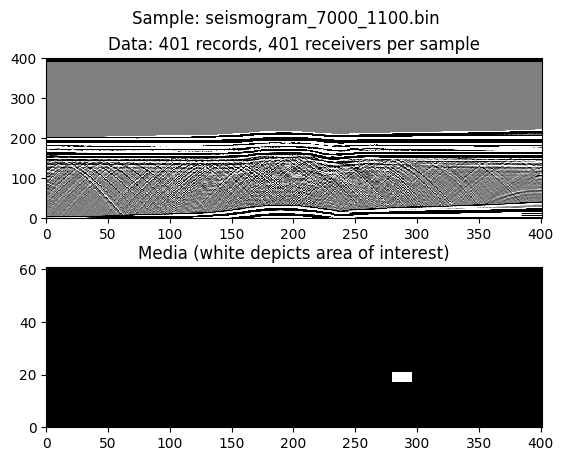

Media shape (61, 401)
Signal shape (401, 401)


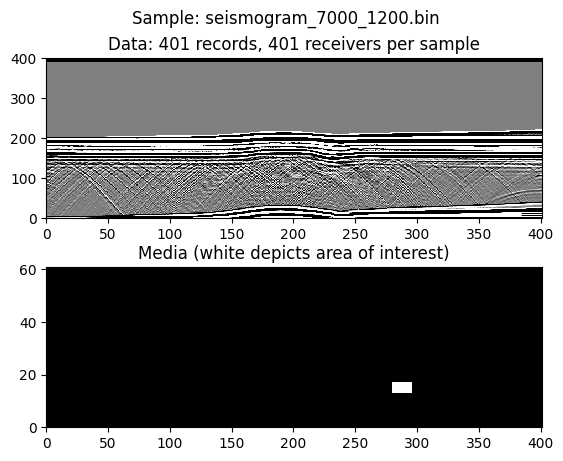

Media shape (61, 401)
Signal shape (401, 401)


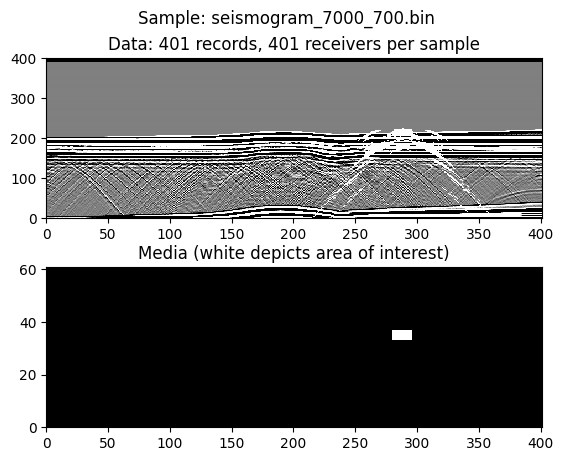

Media shape (61, 401)
Signal shape (401, 401)


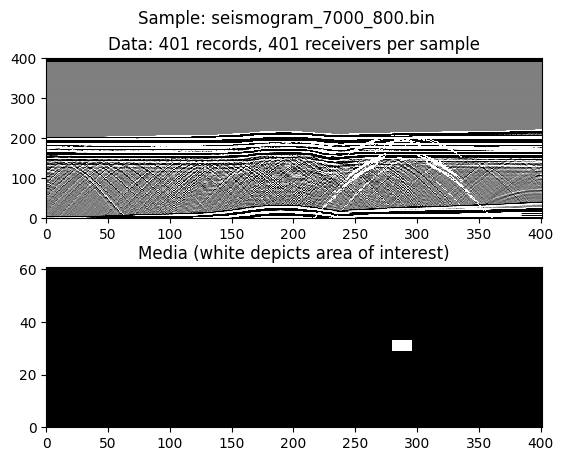

Media shape (61, 401)
Signal shape (401, 401)


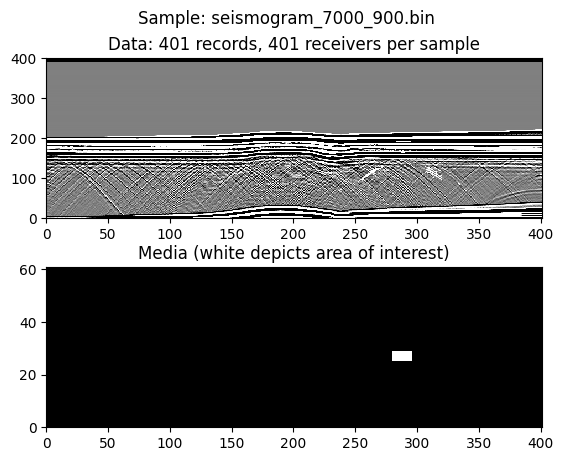

Media shape (61, 401)
Signal shape (401, 401)


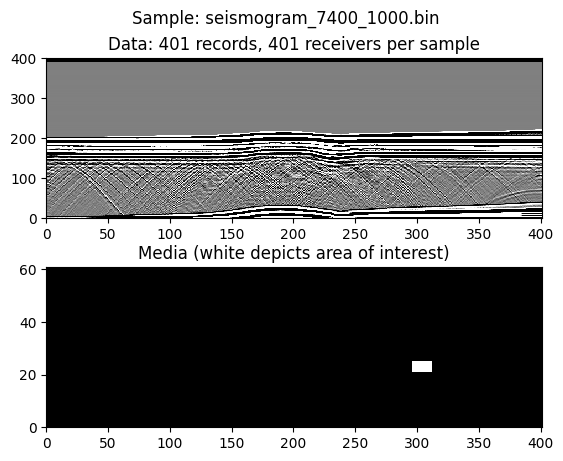

Media shape (61, 401)
Signal shape (401, 401)


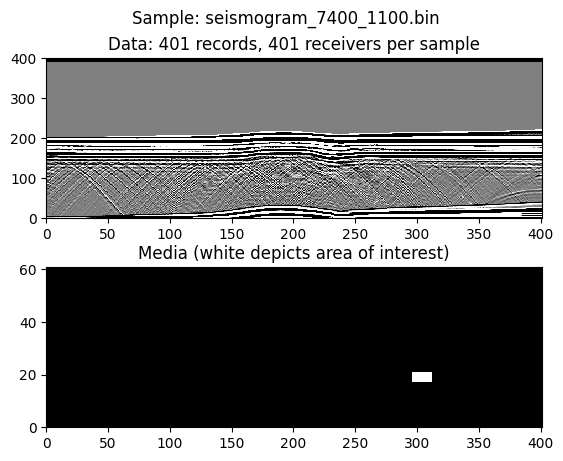

Media shape (61, 401)
Signal shape (401, 401)


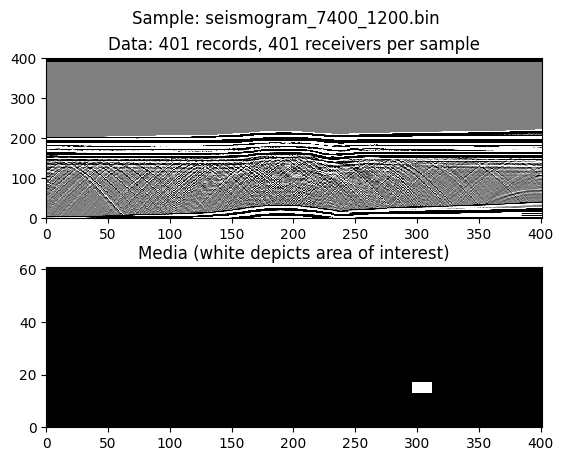

Media shape (61, 401)
Signal shape (401, 401)


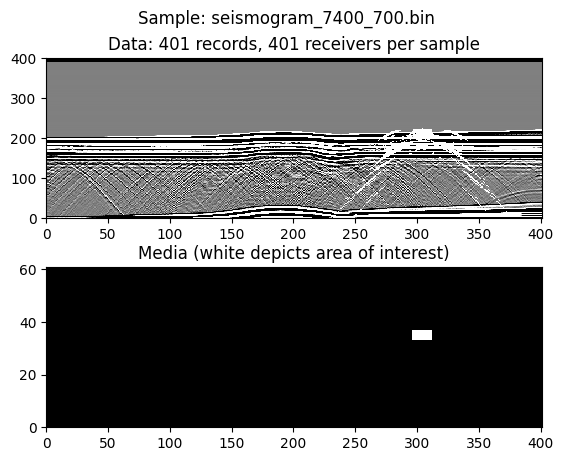

Media shape (61, 401)
Signal shape (401, 401)


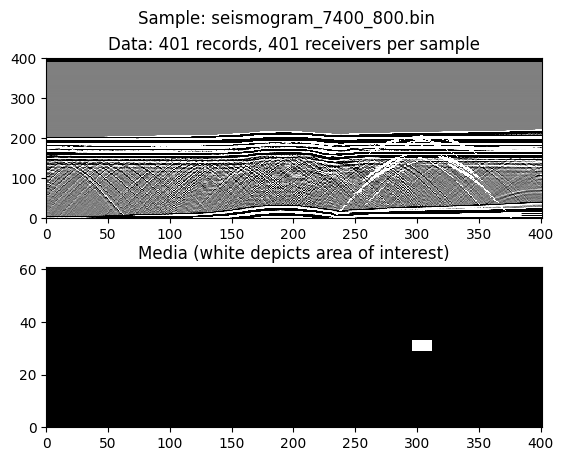

Media shape (61, 401)
Signal shape (401, 401)


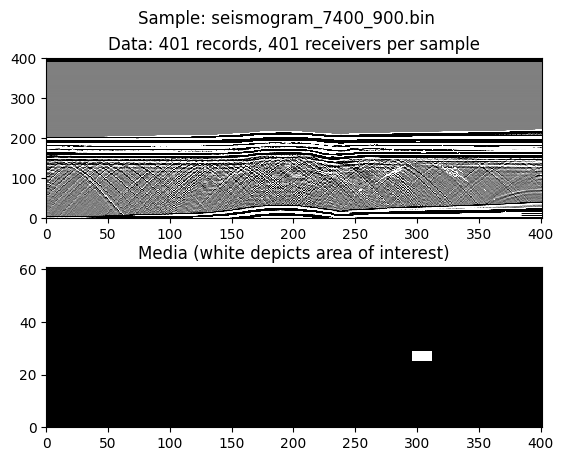

Media shape (61, 401)
Signal shape (401, 401)


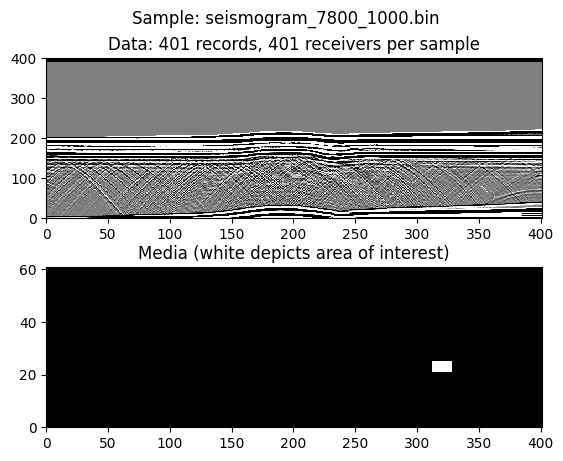

Media shape (61, 401)
Signal shape (401, 401)


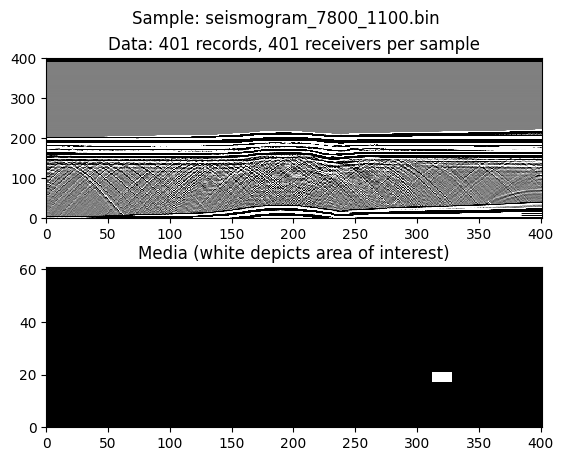

Media shape (61, 401)
Signal shape (401, 401)


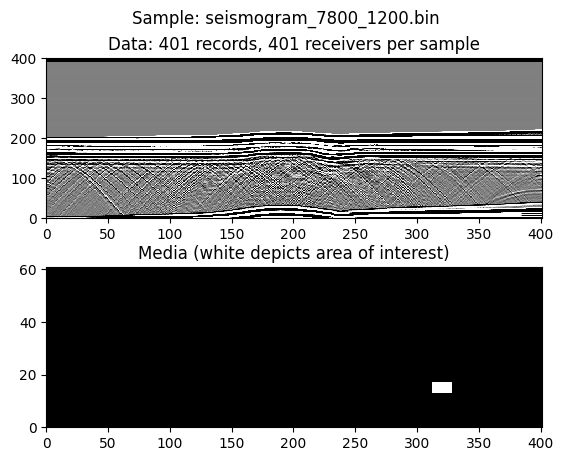

Media shape (61, 401)
Signal shape (401, 401)


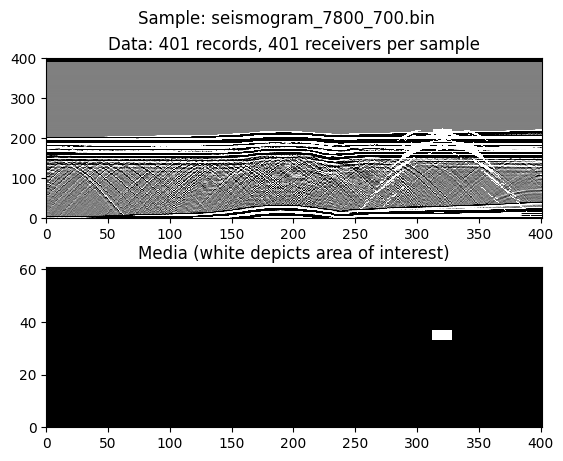

Media shape (61, 401)
Signal shape (401, 401)


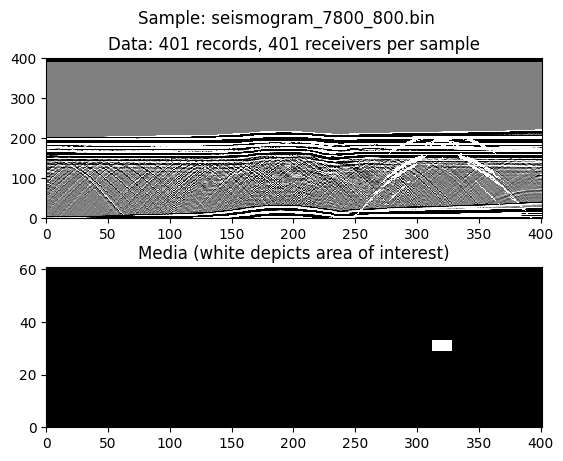

Media shape (61, 401)
Signal shape (401, 401)


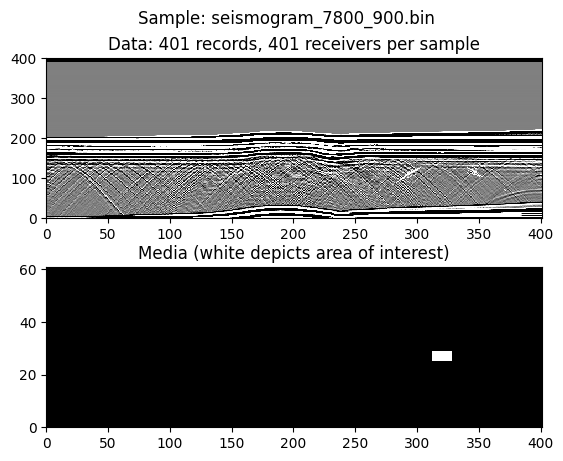

Media shape (61, 401)
Signal shape (401, 401)


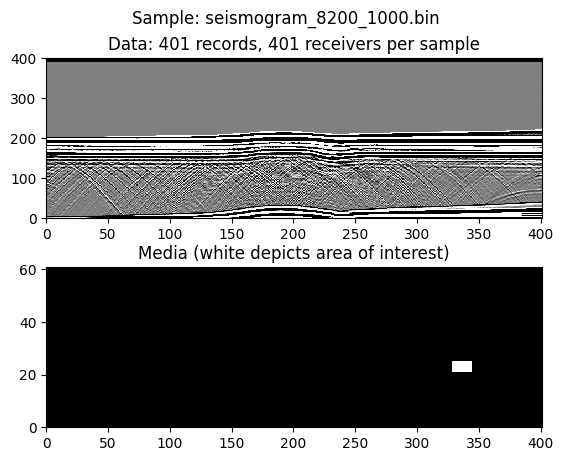

Media shape (61, 401)
Signal shape (401, 401)


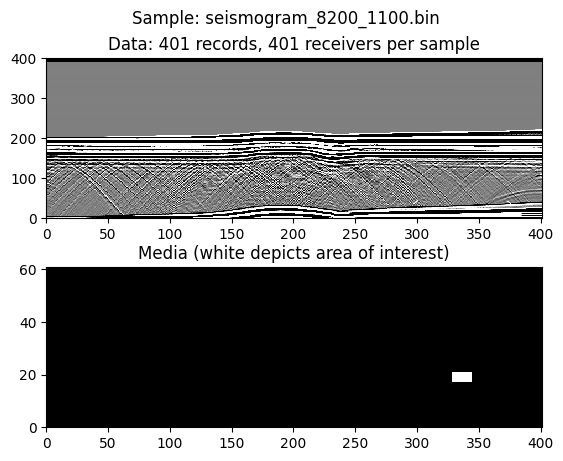

Media shape (61, 401)
Signal shape (401, 401)


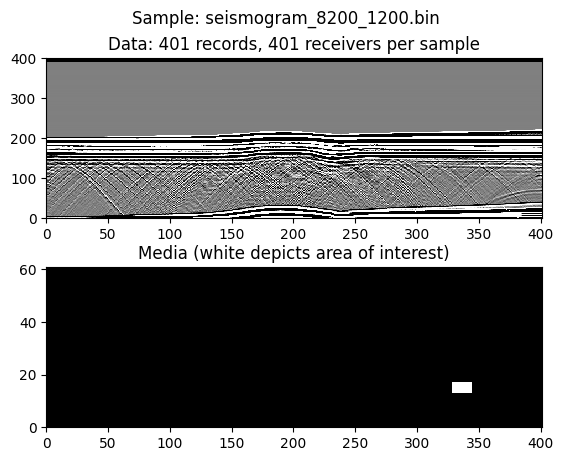

Media shape (61, 401)
Signal shape (401, 401)


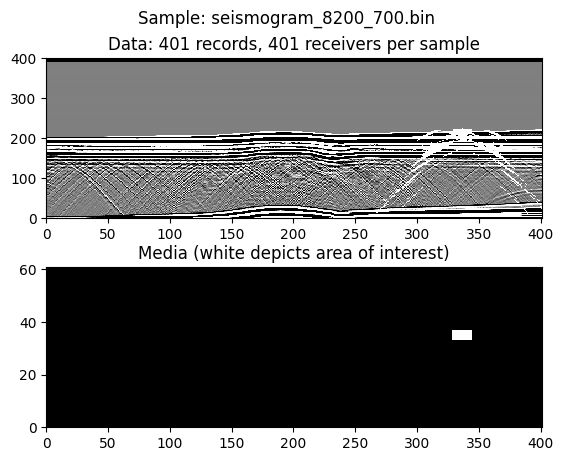

Media shape (61, 401)
Signal shape (401, 401)


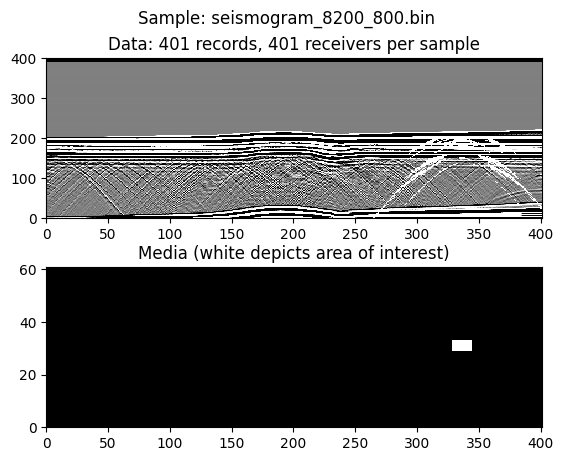

Media shape (61, 401)
Signal shape (401, 401)


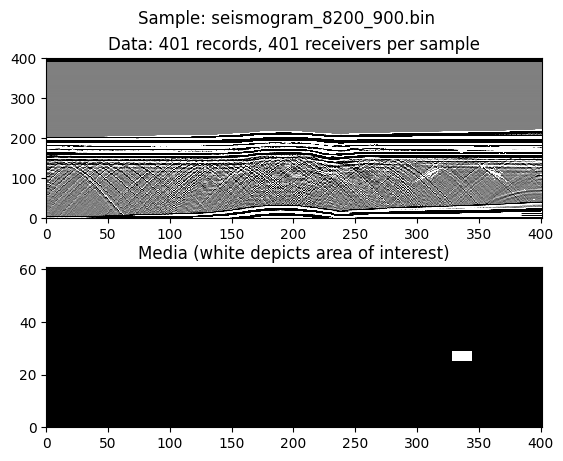

Media shape (61, 401)
Signal shape (401, 401)


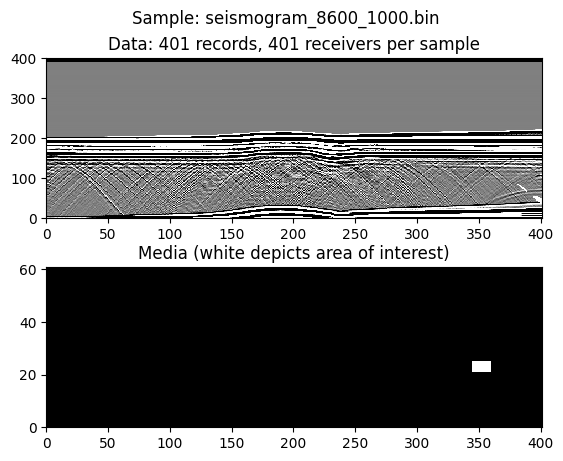

Media shape (61, 401)
Signal shape (401, 401)


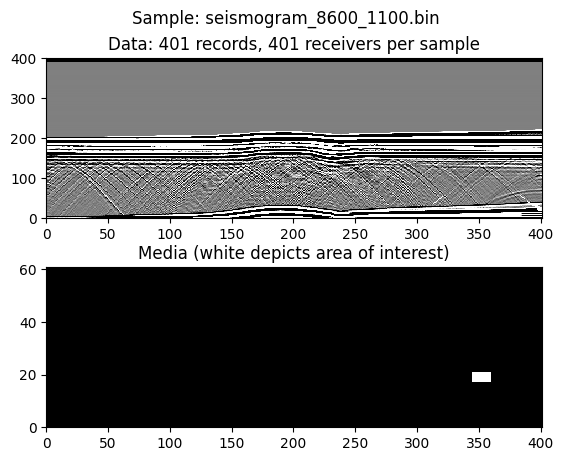

Media shape (61, 401)
Signal shape (401, 401)


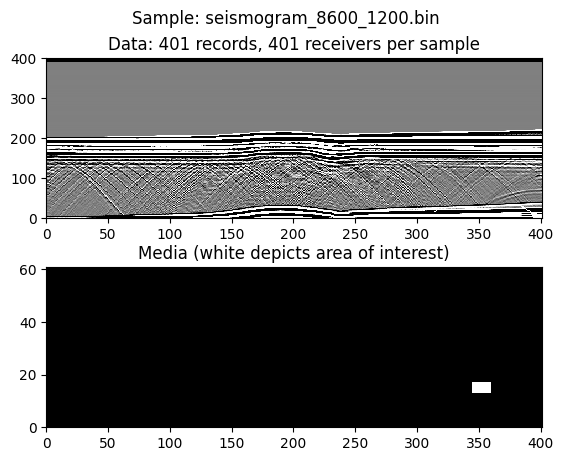

Media shape (61, 401)
Signal shape (401, 401)


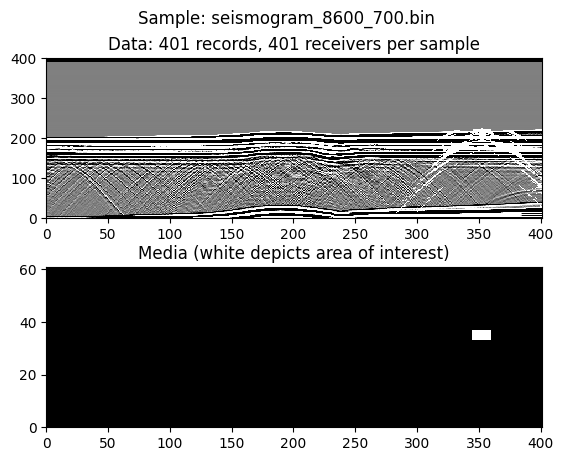

Media shape (61, 401)
Signal shape (401, 401)


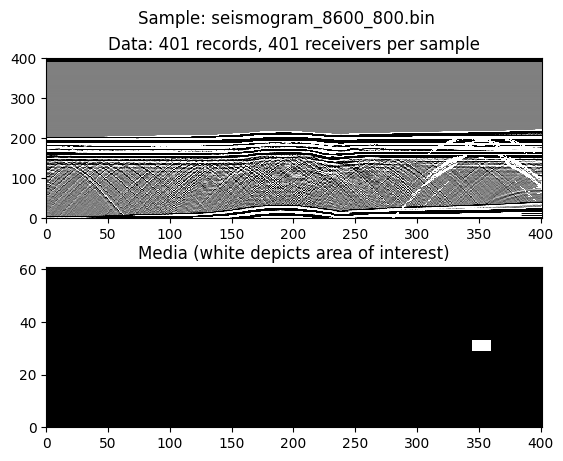

Media shape (61, 401)
Signal shape (401, 401)


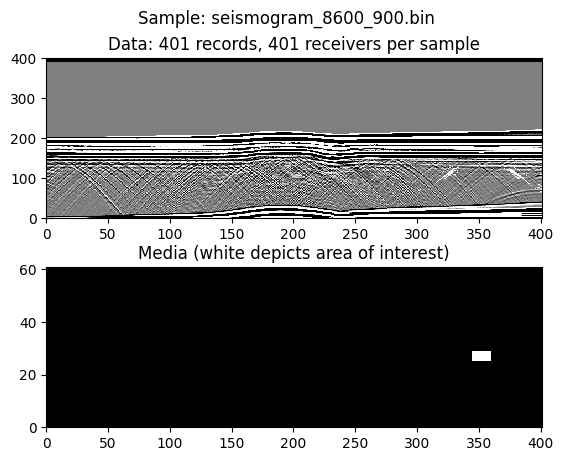

Media shape (61, 401)
Signal shape (401, 401)


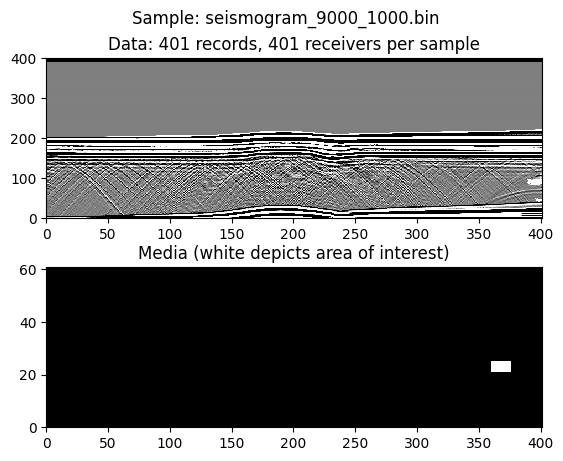

Media shape (61, 401)
Signal shape (401, 401)


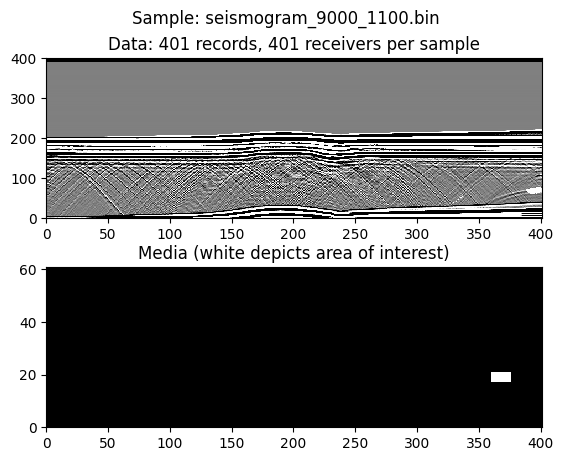

Media shape (61, 401)
Signal shape (401, 401)


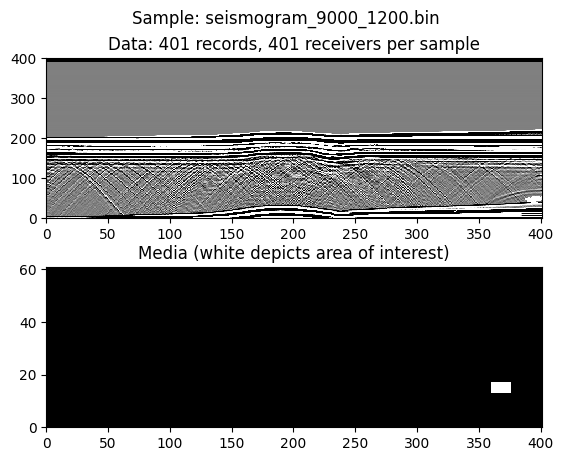

Media shape (61, 401)
Signal shape (401, 401)


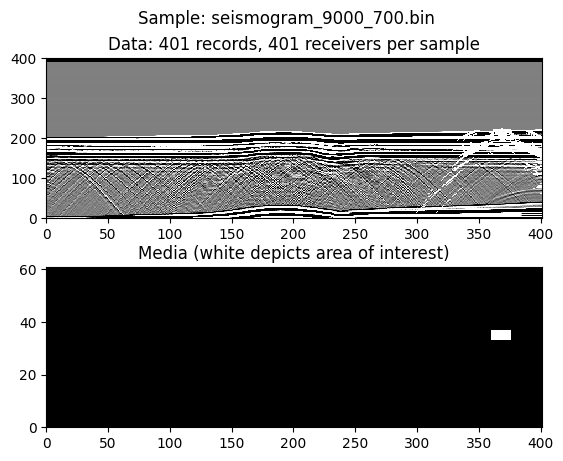

Media shape (61, 401)
Signal shape (401, 401)


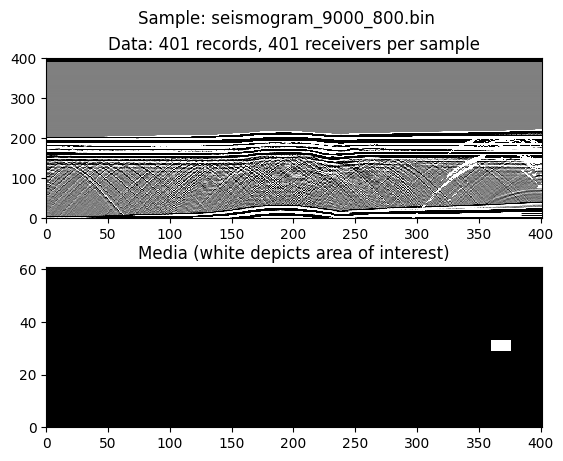

Media shape (61, 401)
Signal shape (401, 401)


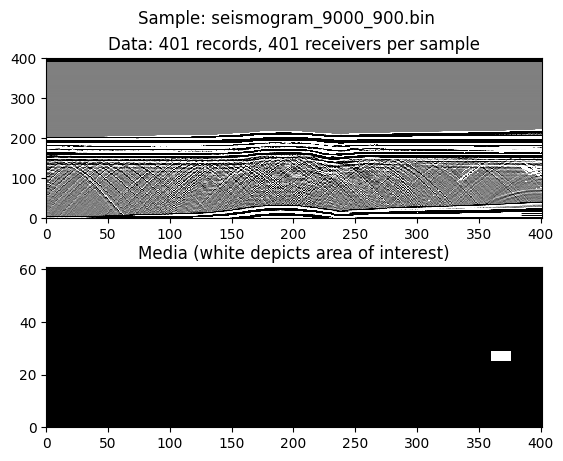

In [ ]:
for bin in fds:
  if re.match(r'seismogram_\d+_\d+(.bin)\b', bin):
    file_name = bin
    #print(bin)

    # read media
    # overall sizes are fixed 
    space_step = AREA_WIDTH / (NUMBER_OF_RECEIVERS - 1)
    media = np.zeros(shape=(int(AREA_HIGHT / space_step) + 1, int(AREA_WIDTH / space_step) + 1), dtype=np.float64)

    # x0 and y0 of the inclusion should be parsed from file name
    # inclusion sizes are fixed
    _, x0, y0 = file_name.split('.')[0].split('_')
    left_x = int(int(x0) / space_step)
    right_x = int((int(x0) + BLOCK_WIDTH) / space_step)
    bottom_y = int(int(y0) / space_step)
    top_y = int((int(y0) - BLOCK_HEIGHT) / space_step)

    media[top_y:bottom_y, left_x:right_x] = 1

    # read signal
    signal = np.ndarray(shape=(NUMBER_OF_SAMPLE, NUMBER_OF_RECEIVERS * 2), dtype=np.float64)
    with open(os.path.join(bin), 'rb') as fd:
        for i in range(NUMBER_OF_SAMPLE):
            ts = struct.unpack('d', fd.read(8))
            signal[i, :] = np.frombuffer(fd.read(8 * NUMBER_OF_RECEIVERS * 2), dtype=np.float64)

    # we are interested in vy only
    signal_vy = signal[:,1::2]
    signal_vx = signal[:,0::2]

    vy_res_only = (abs(signal_vy[::-1,:]-signal_vy_0[::-1,:])> max_y*proc_y)*max_y 
    vx_res_only = (abs(signal_vx[::-1,:]-signal_vx_0[::-1,:])> max_y*proc_x)*max_x

    visib_y[top_y:bottom_y, left_x:right_x] = np.count_nonzero(vy_res_only)/len(vy_res_only)
    visib_x[top_y:bottom_y, left_x:right_x] = np.count_nonzero(vx_res_only)/len(vx_res_only)

    print("Media shape", media.shape)
    print("Signal shape", signal_vy.shape)

    # viz everything (invert OY for this)
    fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1)
    ax1.pcolormesh(vy_res_only + signal_vy_0[::-1,:], cmap=cm.gray, vmin=-1e-7, vmax=1e-7)
    #ax1.pcolormesh(signal_vy[::-1,:], cmap=cm.gray, vmin=-1e-6, vmax=1e-6)
    ax1.set_title(f'Data: {NUMBER_OF_SAMPLE} records, {NUMBER_OF_RECEIVERS} receivers per sample')
    ax2.pcolormesh(media[::-1,:], cmap=cm.gray)
    ax2.set_title(f'Media (white depicts area of interest)')
    fig.suptitle(f'Sample: {file_name}')
    plt.subplots_adjust(wspace=0.3, hspace=0.3)
    plt.show()

visible signal (61, 401)


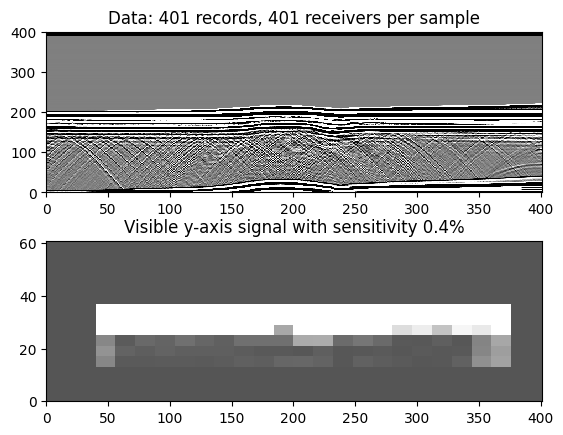

In [ ]:
    print("visible signal", visib_y.shape)

    # viz everything (invert OY for this)
    fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1)
    ax1.pcolormesh(signal_vy_0[::-1,:], cmap=cm.gray, vmin=-1e-7, vmax=1e-7)
    #ax1.pcolormesh(signal_vy[::-1,:], cmap=cm.gray, vmin=-1e-5, vmax=1e-5)
    ax1.set_title(f'Data: {NUMBER_OF_SAMPLE} records, {NUMBER_OF_RECEIVERS} receivers per sample')
    ax2.pcolormesh(visib_y[::-1,:], cmap=cm.gray, vmin= -0.5, vmax=1)
    ax2.set_title(f'Visible y-axis signal with sensitivity {proc_y*100}%')
    
    plt.subplots_adjust(wspace=0.3, hspace=0.3)
    plt.show()

In [ ]:
vy_res_only.nonzero()

(array([  0,  14,  44,  57,  60,  63,  66,  69,  73,  73,  74,  75,  75,
         76,  77,  77,  78,  90,  91,  91,  92,  92,  92,  93,  94,  95,
         95,  96,  96,  96,  96,  96,  97,  97,  97,  98,  98,  98,  99,
         99,  99, 100, 100, 100, 100, 101, 101, 102, 102, 102, 102, 103,
        103, 103, 104, 104, 104, 104, 105, 105, 105, 105, 106, 106, 106,
        106, 106, 107, 107, 107, 107, 107, 108, 108, 108, 108, 108, 108,
        108, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 110,
        110, 110, 110, 110, 110, 110, 110, 110, 110, 110, 110, 110, 111,
        111, 111, 111, 111, 111, 111, 111, 111, 112, 112, 112, 112, 112,
        112, 112, 112, 112, 112, 112, 112, 112, 113, 113, 113, 113, 113,
        113, 113, 113, 113, 113, 113, 113, 113, 114, 114, 114, 114, 114,
        114, 114, 114, 114, 114, 114, 114, 114, 115, 115, 115, 115, 115,
        115, 115, 115, 115, 115, 115, 115, 115, 115, 116, 116, 116, 116,
        116, 116, 116, 116, 116, 116, 116, 116, 116

visible signal (61, 401)


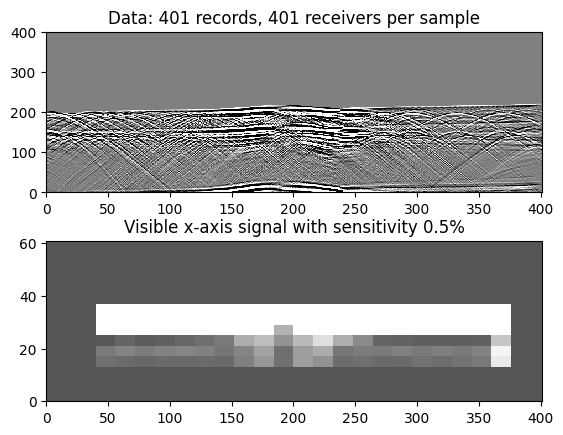

In [ ]:
    print("visible signal", visib_x.shape)

    # viz everything (invert OY for this)
    fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1)
    ax1.pcolormesh(signal_vx_0[::-1,:], cmap=cm.gray, vmin=-1e-7, vmax=1e-7)
    #ax1.pcolormesh(signal_vy[::-1,:], cmap=cm.gray, vmin=-1e-5, vmax=1e-5)
    ax1.set_title(f'Data: {NUMBER_OF_SAMPLE} records, {NUMBER_OF_RECEIVERS} receivers per sample')
    ax2.pcolormesh(visib_x[::-1,:], cmap=cm.gray, vmin= -0.5, vmax=1)
    ax2.set_title(f'Visible x-axis signal with sensitivity {proc_x*100}%')
    
    plt.subplots_adjust(wspace=0.3, hspace=0.3)
    plt.show()